##### Nigel K. Gondo: Data Warrior Analytics

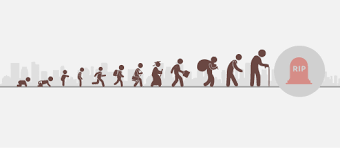

In [1]:
from PIL import Image
Image.open('life.png')

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Brief-Description" data-toc-modified-id="Brief-Description-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Brief Description</a></span></li><li><span><a href="#Importing-the-relevant-libraries" data-toc-modified-id="Importing-the-relevant-libraries-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Importing the relevant libraries</a></span></li><li><span><a href="#Data-importation-and-data-wrangling" data-toc-modified-id="Data-importation-and-data-wrangling-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Data importation and data wrangling</a></span><ul class="toc-item"><li><span><a href="#Brief-description-of-the-variables" data-toc-modified-id="Brief-description-of-the-variables-3.1"><span class="toc-item-num">3.1&nbsp;&nbsp;</span>Brief description of the variables</a></span></li><li><span><a href="#Data-wrangling" data-toc-modified-id="Data-wrangling-3.2"><span class="toc-item-num">3.2&nbsp;&nbsp;</span>Data wrangling</a></span></li></ul></li><li><span><a href="#EDA" data-toc-modified-id="EDA-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>EDA</a></span><ul class="toc-item"><li><span><a href="#EDA-of-developed-nations" data-toc-modified-id="EDA-of-developed-nations-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>EDA of developed nations</a></span></li><li><span><a href="#EDA-for-developing-nations" data-toc-modified-id="EDA-for-developing-nations-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>EDA for developing nations</a></span></li><li><span><a href="#EDA-of-combined-data-set-developed-and-developing" data-toc-modified-id="EDA-of-combined-data-set-developed-and-developing-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>EDA of combined data set developed and developing</a></span></li><li><span><a href="#Summaring-the--variables-to-be-used-for-regression-using-a-raincloud-chart" data-toc-modified-id="Summaring-the--variables-to-be-used-for-regression-using-a-raincloud-chart-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Summaring the  variables to be used for regression using a raincloud chart</a></span></li></ul></li><li><span><a href="#Regression-model" data-toc-modified-id="Regression-model-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Regression model</a></span><ul class="toc-item"><li><span><a href="#Train-Test" data-toc-modified-id="Train-Test-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Train-Test</a></span></li><li><span><a href="#Fitting,-training-and-testing-the-model" data-toc-modified-id="Fitting,-training-and-testing-the-model-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Fitting, training and testing the model</a></span></li><li><span><a href="#Metrics" data-toc-modified-id="Metrics-5.3"><span class="toc-item-num">5.3&nbsp;&nbsp;</span>Metrics</a></span></li></ul></li></ul></div>

# Brief Description

The purpose of this project was to assess the life expectancy of countries around the world, and how it is affected by certain socio-economic and health factors, such as income, schooling, and diseases. The data I obtained from Kaggle, however, originally it is from the Global Health Observatory (GHO) data repository under World Health Organization (WHO). The time series of the data is from 2000  to 2015.

# Importing the relevant libraries

In [2]:
#Data manipulation and vectorised operations
import pandas as pd
import numpy as np

#Machine learning algorithms 
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import (mean_absolute_error,
                             mean_squared_error)
from sklearn.preprocessing import StandardScaler

#Data visualisation
import matplotlib.pyplot as plt
import seaborn as sns
import ptitprince as pt
from ptitprince import RainCloud
%matplotlib inline
sns.set()
sns.set_style('white')

#Setting fixed figure size
plt.rcParams.update({'figure.figsize':(10,8), 'figure.dpi':100})

#Removing warning messeages
import warnings
warnings.filterwarnings('ignore')

# Data importation and data wrangling

In [3]:
#Importing the csv data
df_who = pd.read_csv('Life Expectancy Data.csv')
df_who.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


## Brief description of the variables

**Country**: Countries around the world

**Year**: 2000 to 2015

**Status**: Indicating if a country is developed of developing

**Life expectancy**: Estimated average of the number of additional years that a person of a given age can expect to live.

**Adult Mortality**: Adult Mortality Rates of both sexes (probability of dying between 15 and 60 years per 1000 population)

**infant deaths**: Number of Infant Deaths per 1000 population

**Alcohol**: Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol) -percentage expenditure: Expenditure on health as a percentage of Gross Domestic Product per capita(%)

**Hepatitis B**: Hepatitis B (HepB) immunization coverage among 1-year-olds (%)

**Measles**: Measles - number of reported cases per 1000 population

**BMI**: Average Body Mass Index of entire population

**under-five deaths**: Number of under-five deaths per 1000 population

**Polio**: Polio (Pol3) immunization coverage among 1-year-olds (%)

**Total expenditure**: General government expenditure on health as a percentage of total government expenditure (%)

**Diphtheria**: Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)

**HIV/AIDS**: Deaths per 1 000 live births HIV/AIDS (0-4 years)

**GDP**: Gross Domestic Product per capita (in USD)

**Population**: Population of the country

**thinness 1-19 years**: Prevalence of thinness among children and adolescents for Age 10 to 19 (%)

**thinness 5-9 years**: Prevalence of thinness among children for Age 5 to 9(%)

**Income composition of resources**: Human Development Index in terms of income composition of resources (index ranging from 0 to 1)

**Schooling**: Number of years of Schooling in year

## Data wrangling

In [4]:
#Checking on data types
df_who.dtypes

Country                             object
Year                                 int64
Status                              object
Life expectancy                    float64
Adult Mortality                    float64
infant deaths                        int64
Alcohol                            float64
percentage expenditure             float64
Hepatitis B                        float64
Measles                              int64
 BMI                               float64
under-five deaths                    int64
Polio                              float64
Total expenditure                  float64
Diphtheria                         float64
 HIV/AIDS                          float64
GDP                                float64
Population                         float64
 thinness  1-19 years              float64
 thinness 5-9 years                float64
Income composition of resources    float64
Schooling                          float64
dtype: object

In [5]:
#Changing the data types of object to category
df_who[['Country', 'Status']] = df_who[['Country', 'Status']]\
                                .astype('category') #object changed to category

df_who.dtypes

Country                            category
Year                                  int64
Status                             category
Life expectancy                     float64
Adult Mortality                     float64
infant deaths                         int64
Alcohol                             float64
percentage expenditure              float64
Hepatitis B                         float64
Measles                               int64
 BMI                                float64
under-five deaths                     int64
Polio                               float64
Total expenditure                   float64
Diphtheria                          float64
 HIV/AIDS                           float64
GDP                                 float64
Population                          float64
 thinness  1-19 years               float64
 thinness 5-9 years                 float64
Income composition of resources     float64
Schooling                           float64
dtype: object

In [6]:
#Some column headers have trailing & leading spaces so removing those trailing spaces
df_who.columns = df_who.columns.str.strip() 
df_who.columns 

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

In [7]:
#Checking for null values
df_who.isnull().sum() #There are a number of columns with null values

Country                              0
Year                                 0
Status                               0
Life expectancy                     10
Adult Mortality                     10
infant deaths                        0
Alcohol                            194
percentage expenditure               0
Hepatitis B                        553
Measles                              0
BMI                                 34
under-five deaths                    0
Polio                               19
Total expenditure                  226
Diphtheria                          19
HIV/AIDS                             0
GDP                                448
Population                         652
thinness  1-19 years                34
thinness 5-9 years                  34
Income composition of resources    167
Schooling                          163
dtype: int64

In [8]:
#Filling in null values with the mean of the columns
df_who_nulls_filled = df_who.copy()

df_who_nulls_filled['Life expectancy'].fillna(df_who_nulls_filled['Life expectancy'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Adult Mortality'].fillna(df_who_nulls_filled['Adult Mortality'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Alcohol'].fillna(df_who_nulls_filled['Alcohol'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Hepatitis B'].fillna(df_who_nulls_filled['Hepatitis B'].mean(), 
                                              inplace=True)

df_who_nulls_filled['BMI'].fillna(df_who_nulls_filled['BMI'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Polio'].fillna(df_who_nulls_filled['Polio'].mean(), 
                                              inplace=True)

df_who_nulls_filled['BMI'].fillna(df_who_nulls_filled['BMI'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Total expenditure'].fillna(df_who_nulls_filled['Total expenditure'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Diphtheria'].fillna(df_who_nulls_filled['Diphtheria'].mean(), 
                                              inplace=True)

df_who_nulls_filled['GDP'].fillna(df_who_nulls_filled['GDP'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Population'].fillna(df_who_nulls_filled['Population'].mean(), 
                                              inplace=True)

df_who_nulls_filled['thinness  1-19 years'].fillna(df_who_nulls_filled['thinness  1-19 years'].mean(), 
                                              inplace=True)

df_who_nulls_filled['thinness 5-9 years'].fillna(df_who_nulls_filled['thinness 5-9 years'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Income composition of resources'].fillna(df_who_nulls_filled['Income composition of resources'].mean(), 
                                              inplace=True)

df_who_nulls_filled['Schooling'].fillna(df_who_nulls_filled['Schooling'].mean(), 
                                              inplace=True)

In [9]:
#Verifying if nulls values were filled
df_who_nulls_filled.isnull().sum() #Null values filled

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
BMI                                0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
thinness  1-19 years               0
thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64

In [10]:
#Checking for duplicate values
df_who_nulls_filled.duplicated().sum() #No duplicate values

0

# EDA

## EDA of developed nations

In [11]:
#Creating a seperate dataframe for developed nations
df_who_developed = df_who_nulls_filled[df_who_nulls_filled['Status'] == 'Developed']
df_who_developed.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
112,Australia,2015,Developed,82.8,59.0,1,4.602861,0.00000,93.0,74,...,93.0,5.93819,93.0,0.1,56554.38760,23789338.0,0.6,0.6,0.937,20.4
113,Australia,2014,Developed,82.7,6.0,1,9.710000,10769.36305,91.0,340,...,92.0,9.42000,92.0,0.1,62214.69120,2346694.0,0.6,0.6,0.936,20.4
114,Australia,2013,Developed,82.5,61.0,1,9.870000,11734.85381,91.0,158,...,91.0,9.36000,91.0,0.1,67792.33860,23117353.0,0.6,0.6,0.933,20.3
115,Australia,2012,Developed,82.3,61.0,1,10.030000,11714.99858,91.0,199,...,92.0,9.36000,92.0,0.1,67677.63477,22728254.0,0.6,0.6,0.930,20.1
116,Australia,2011,Developed,82.0,63.0,1,10.300000,10986.26527,92.0,190,...,92.0,9.20000,92.0,0.1,62245.12900,223424.0,0.6,0.6,0.927,19.8


In [12]:
#Checking how many developed countries are in the dataset
pd.unique(df_who_developed['Country'])

['Australia', 'Austria', 'Belgium', 'Bulgaria', 'Canada', ..., 'Spain', 'Sweden', 'Switzerland', 'United Kingdom of Great Britain and Northern ..., 'United States of America']
Length: 38
Categories (193, object): ['Afghanistan', 'Albania', 'Algeria', 'Angola', ..., 'Viet Nam', 'Yemen', 'Zambia', 'Zimbabwe']

In [13]:
#Summary statistics for developed countries
df_who_developed.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,608.000000,6.080000e+02,608.000000,6.080000e+02,608.000000,608.000000,608.000000,608.000000
mean,2007.500000,79.525164,78.049342,1.473684,9.317660,2659.918311,84.022317,591.430921,51.441612,1.773026,93.611842,7.436449,93.692434,1.000000e-01,20298.485089,8.180841e+06,1.257566,1.215461,0.831147,15.479176
std,4.613568,3.849176,45.252841,4.232451,3.028224,3666.378606,19.486149,2921.805721,17.726659,4.966888,11.650766,2.889352,12.099497,9.722450e-16,21096.651571,1.398959e+07,0.722417,0.788879,0.084381,1.976105
min,2000.000000,69.900000,1.000000,0.000000,0.010000,0.000000,2.000000,0.000000,3.000000,0.000000,9.000000,1.100000,9.000000,1.000000e-01,12.277330,1.230000e+02,0.300000,0.200000,0.627551,11.500000
25%,2003.750000,77.375000,61.000000,0.000000,7.807500,85.443430,80.940461,1.000000,53.700000,0.000000,93.000000,5.977047,94.000000,1.000000e-01,4508.034120,2.592545e+05,0.700000,0.600000,0.800750,14.275000
50%,2007.500000,79.500000,74.000000,0.000000,9.905000,857.228411,89.000000,13.000000,57.600000,0.000000,96.000000,7.750000,96.000000,1.000000e-01,10425.160255,3.276911e+06,1.000000,1.000000,0.857000,15.700000
75%,2011.250000,81.900000,92.000000,2.000000,11.475000,4102.863046,96.000000,104.000000,61.500000,2.000000,98.000000,9.185000,98.000000,1.000000e-01,33665.705045,1.275338e+07,1.725000,1.800000,0.889000,16.600000
max,2015.000000,89.000000,229.000000,28.000000,15.190000,19479.911610,99.000000,33812.000000,69.600000,33.000000,99.000000,17.600000,99.000000,1.000000e-01,119172.741800,8.253418e+07,4.000000,4.300000,0.948000,20.700000


In [14]:
#Calculating the average life expetancy from 2000 to 2015 and ordering the dataframe using a background gradient
df_who_avg_LifeExp_developed = pd.DataFrame(df_who_developed\
                                  .groupby(['Country'])['Life expectancy']\
                                  .mean()\
                                  .sort_values(ascending=False))

df_who_avg_LifeExp_developed.dropna().style.background_gradient()

,Life expectancy
Country,
Japan,82.537500
Sweden,82.518750
Iceland,82.443750
Switzerland,82.331250
France,82.218750
Italy,82.187500
Spain,82.068750
Australia,81.812500
Norway,81.793750


In developed nations the average life expectancy is quite high, where it ranges from the low 70's all the way to the low 80's with Japan topping the list.

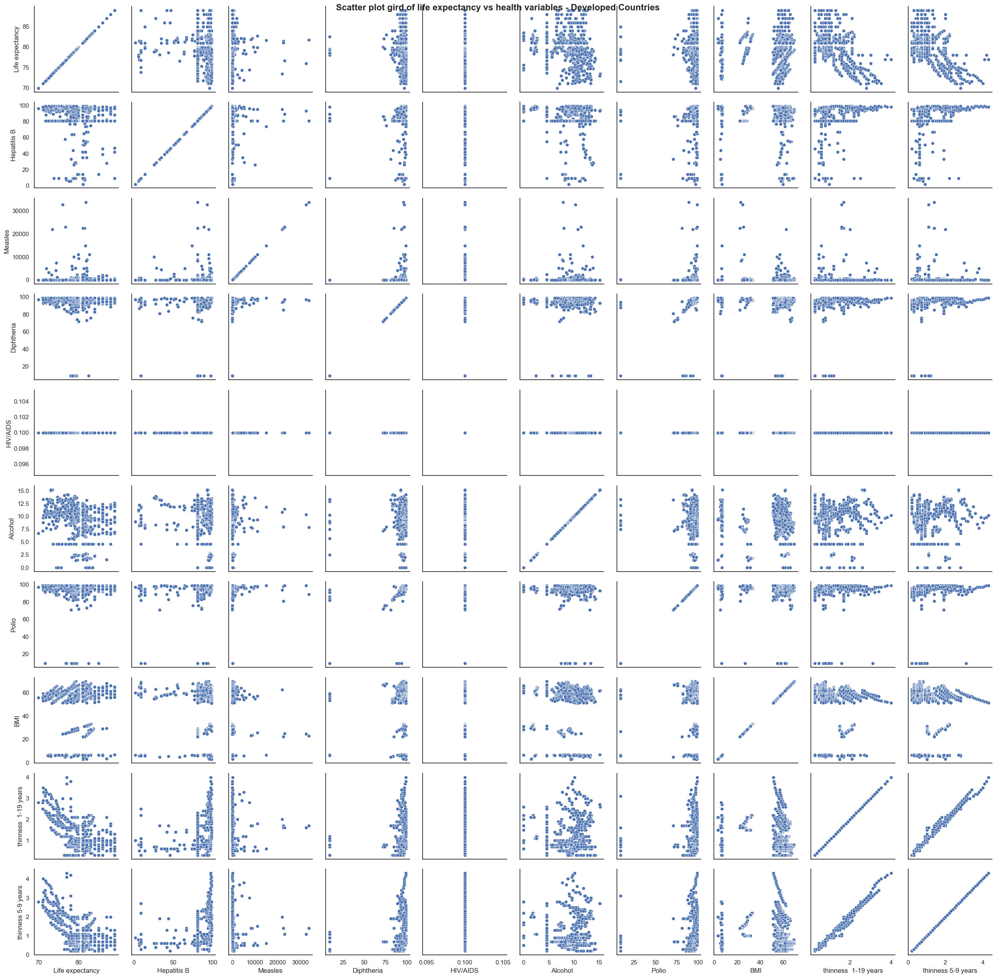

In [15]:
#A grid scatter plot of life expectancy vs the health variables
#Creating new dataframe with life expectancy and health variables for the grid plot
df_who_developed_health = df_who_developed[['Life expectancy',
                                            'Hepatitis B',
                                            'Measles',
                                            'Diphtheria',
                                            'HIV/AIDS',
                                            'Alcohol',
                                            'Polio',
                                            'BMI',
                                            'thinness  1-19 years',
                                            'thinness 5-9 years']]

#Plotting the scatter plots on a grid
g = sns.PairGrid(df_who_developed_health, 
                 palette='mediumblue')

g.map(sns.scatterplot)

g.add_legend()

g.fig.suptitle('Scatter plot gird of life expectancy vs health variables - Developed Countries', 
               fontsize=16, 
               fontweight='bold')

plt.tight_layout()

It seems for developed nations the health variables have no clear correlation with life expectancy. However, for the variables of 'thinness 1-19 years' and 'thinness 5-9 years' there seems to be a partial negative correlation with life expectancy. Also these two explanatory variables are highly correlated with each other. For the other health variable there no visible correlations with each other.

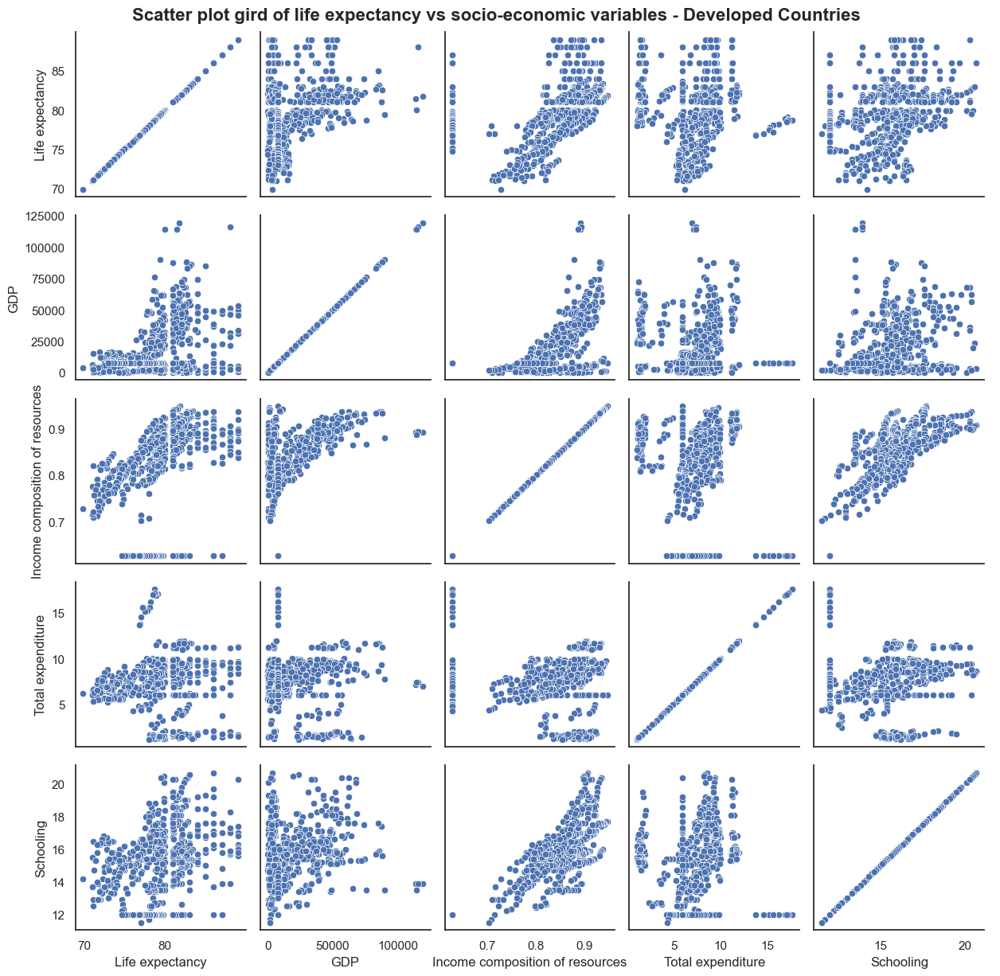

In [16]:
#A grid scatter plot of life expectancy vs the socio-economic variables
#Creating new dataframe with life expectancy and socio-economic variables
df_who_developed_economic = df_who_developed[['Life expectancy',
                                              'GDP', 
                                              'Income composition of resources', 
                                              'Total expenditure',
                                              'Schooling']]

#Plotting the scatter plots on a grid
g = sns.PairGrid(df_who_developed_economic,
                palette='mediumblue')
g.map(sns.scatterplot)
g.add_legend()
g.fig.suptitle('Scatter plot gird of life expectancy vs socio-economic variables - Developed Countries', 
               fontsize=16, 
               fontweight='bold')
plt.tight_layout()

In terms of the socio-economic factors life expectancy has a positive correlation with income composition of resources. Life expectancy also seems to have a partial positive correlation with schooling as well.

The explanatory variables of schooling and income composition of resources are positively correlated. This suggest that the more years on schooling once can accumulated the more they are able to acquire income resources.

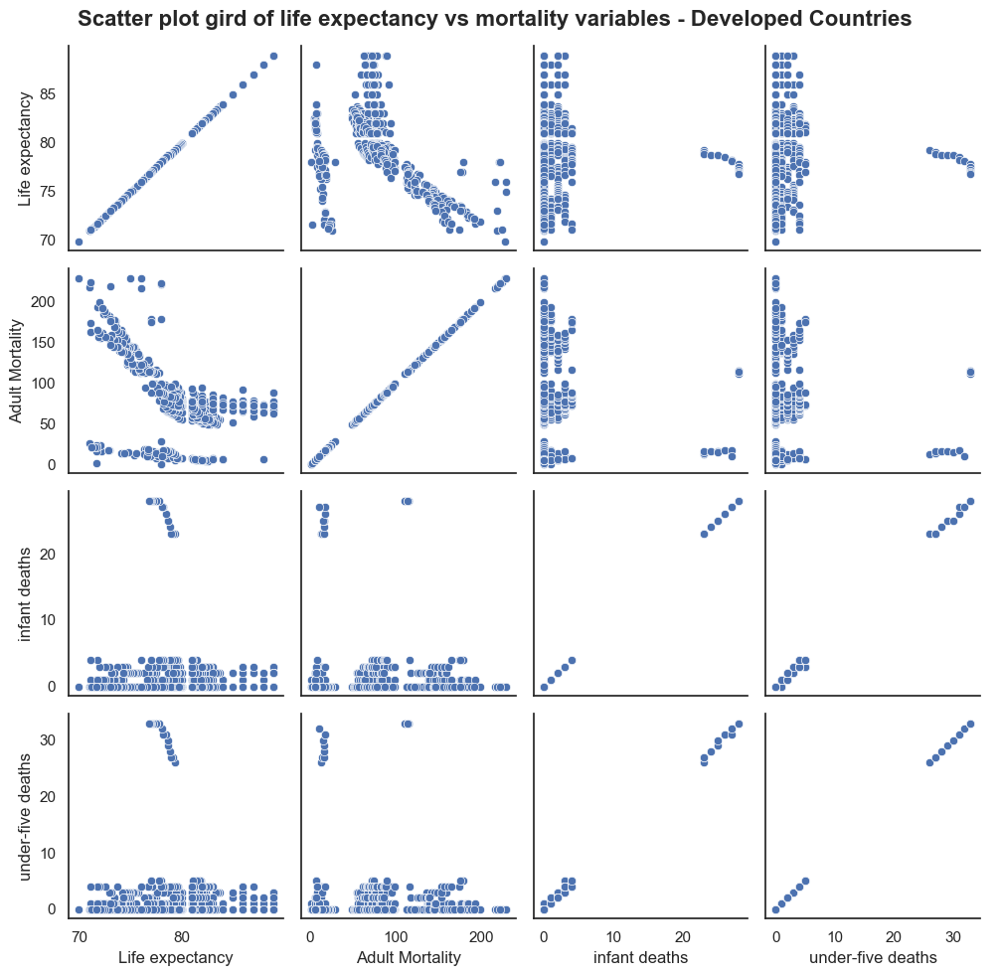

In [17]:
#A grid scatter plot of life expectancy vs mortality variables
#Creating new dataframe with life expectancy and mortality variables
df_who_developed_mortality = df_who_developed[['Life expectancy',
                                               'Adult Mortality', 
                                               'infant deaths', 
                                               'under-five deaths']]

#Ploting the scatter plots on a grid
g = sns.PairGrid(df_who_developed_mortality, 
                 palette='mediumblue')

g.map(sns.scatterplot)

g.add_legend()

g.fig.suptitle('Scatter plot gird of life expectancy vs mortality variables - Developed Countries', 
               fontsize=16, 
               fontweight='bold')

plt.tight_layout()

Adult mortality has a partial negative correlation with life expectancy.

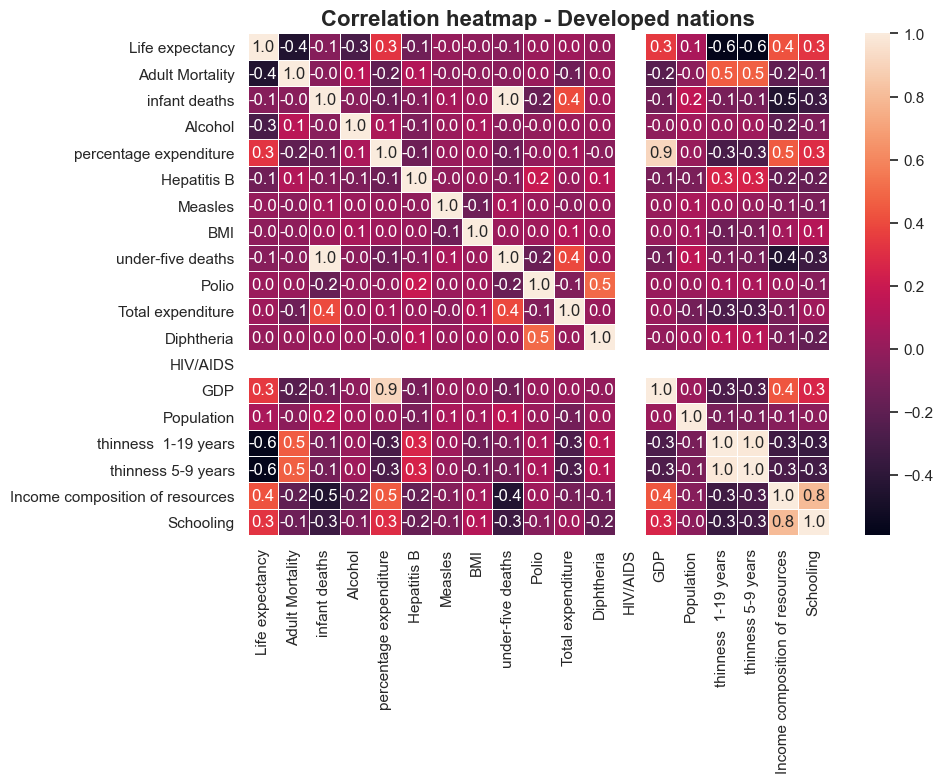

In [18]:
#Correlation heatmap
sns.heatmap(df_who_developed.drop(columns='Year').corr(), 
            annot=True, 
            fmt=".1f", 
            linewidth=.5)

plt.title('Correlation heatmap - Developed nations',
          fontsize=16, 
          fontweight='bold')

plt.tight_layout()

plt.show()

## EDA for developing nations

In [19]:
#Creating a seperate dataframe for developed nations
df_who_developing = df_who_nulls_filled[df_who_nulls_filled['Status'] == 'Developing']
df_who_developing.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [20]:
#Checking how many developing countries are in the dataset
pd.unique(df_who_developing['Country'])

['Afghanistan', 'Albania', 'Algeria', 'Angola', 'Antigua and Barbuda', ..., 'Venezuela (Bolivarian Republic of)', 'Viet Nam', 'Yemen', 'Zambia', 'Zimbabwe']
Length: 155
Categories (193, object): ['Afghanistan', 'Albania', 'Algeria', 'Angola', ..., 'Viet Nam', 'Yemen', 'Zambia', 'Zimbabwe']

In [21]:
#Summary statistics for developing countries
df_who_developing.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2330.000000,2.330000e+03,2330.000000,2330.000000,2330.000000,2330.000000
mean,2007.523605,66.537146,187.432603,37.827039,3.372561,236.803422,80.136269,2896.640343,34.897563,52.542060,79.663714,5.547227,79.357578,2.170601,4139.073240,1.394655e+07,5.774442,5.824030,0.574424,11.083041
std,4.614890,8.672253,128.079375,131.372769,3.103842,514.226042,23.264972,12747.614476,19.032002,178.670175,24.739172,2.085810,24.980938,5.623817,6897.022788,5.995215e+07,4.471411,4.558637,0.193396,2.901585
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,59.900000,112.000000,1.000000,0.540000,3.487348,78.000000,0.000000,18.300000,1.000000,74.000000,4.230000,74.000000,0.100000,452.534764,4.750921e+05,2.300000,2.400000,0.468250,9.600000
50%,2008.000000,68.500000,167.000000,7.000000,2.805000,45.921854,87.000000,18.000000,34.850000,8.000000,89.000000,5.580000,89.000000,0.100000,1723.167800,3.746860e+06,4.900000,4.870317,0.627551,11.700000
75%,2012.000000,73.600000,258.000000,29.000000,5.007500,225.603568,96.000000,564.750000,52.100000,41.000000,97.000000,6.580000,96.000000,1.600000,7483.158469,1.275338e+07,7.800000,7.800000,0.714000,13.000000
max,2015.000000,85.000000,723.000000,1800.000000,17.870000,5484.143308,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.240000,99.000000,50.600000,88564.822980,1.293859e+09,27.700000,28.600000,0.864000,17.700000


In [22]:
#Calculating the average life expetancy of developing nations\
#from 2000 to 2015 and ordering the dataframe using a background gradient
df_who_avg_LifeExp_developing = pd.DataFrame(df_who_developing\
                                  .groupby(['Country'])['Life expectancy']\
                                  .mean()\
                                  .sort_values(ascending=False))

df_who_avg_LifeExp_developing.dropna().style.background_gradient()

,Life expectancy
Country,
Chile,79.450000
Costa Rica,78.593750
Cuba,77.975000
Qatar,77.031250
Panama,76.487500
Brunei Darussalam,76.487500
Uruguay,76.075000
Bosnia and Herzegovina,75.968750
Bahrain,75.725000


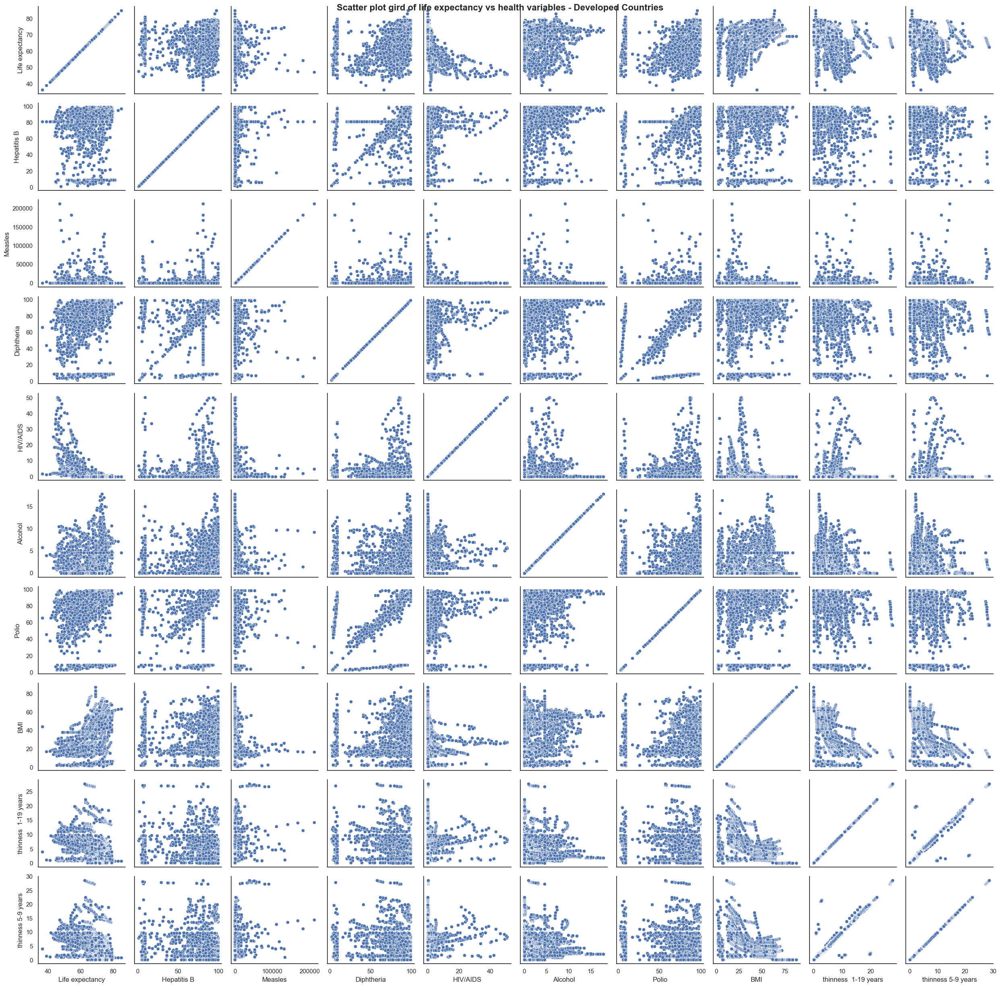

In [23]:
#A grid scatter plot of life expectancy vs the health variables
#Creating new dataframe with life expectancy and health variables for the grid plot
df_who_developing_health = df_who_developing[['Life expectancy',
                                            'Hepatitis B',
                                            'Measles',
                                            'Diphtheria',
                                            'HIV/AIDS',
                                            'Alcohol',
                                            'Polio',
                                            'BMI',
                                            'thinness  1-19 years',
                                            'thinness 5-9 years']]

#Plotting the scatter plots on a grid
g = sns.PairGrid(df_who_developing_health)

g.map(sns.scatterplot)

g.add_legend

g.fig.suptitle('Scatter plot gird of life expectancy vs health variables - Developed Countries', 
               fontsize=16, 
               fontweight='bold')

plt.tight_layout()

From the health variables, HIV/AIDS is the one that shows a visible negative correlation with life expectancy.

## EDA of combined data set developed and developing

In [24]:
#Summary statistics for both developed and developing nations
df_who_nulls_filled.describe()

,Year,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
count,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2938.000000,2.938000e+03,2938.000000,2938.000000,2938.000000,2938.000000
mean,2007.518720,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.938190,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,4.613841,9.507640,124.080302,117.926501,3.916288,1987.914858,22.586855,11467.272489,19.927677,160.445548,23.352143,2.400274,23.640073,5.077785,13136.800417,5.381546e+07,4.394535,4.482708,0.204820,3.264381
min,2000.000000,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.370000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,2004.000000,63.200000,74.000000,0.000000,1.092500,4.685343,80.940461,0.000000,19.400000,0.000000,78.000000,4.370000,78.000000,0.100000,580.486996,4.189172e+05,1.600000,1.600000,0.504250,10.300000
50%,2008.000000,72.000000,144.000000,3.000000,4.160000,64.912906,87.000000,17.000000,43.000000,4.000000,93.000000,5.938190,93.000000,0.100000,3116.561755,3.675929e+06,3.400000,3.400000,0.662000,12.100000
75%,2012.000000,75.600000,227.000000,22.000000,7.390000,441.534144,96.000000,360.250000,56.100000,28.000000,97.000000,7.330000,97.000000,0.800000,7483.158469,1.275338e+07,7.100000,7.200000,0.772000,14.100000
max,2015.000000,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.600000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


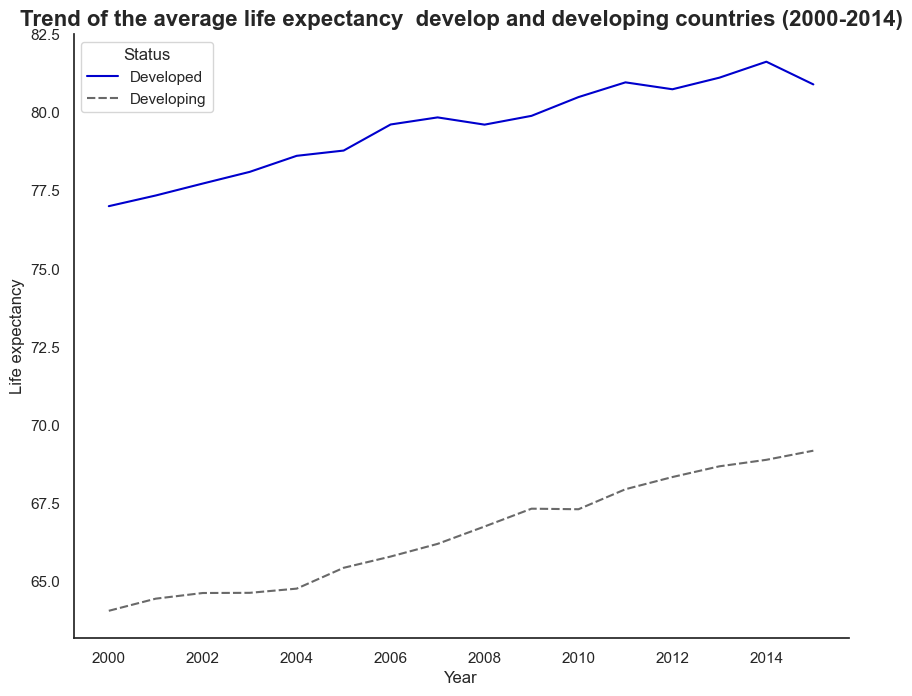

In [25]:
#Visualising the average trend of developing and developed nations life expectancy
df_who_life_exp_dev_deving = df_who_nulls_filled.copy()

#Creating new datatframe - finding the mean life expectancy for each year and spliting by status
df_who_life_exp_trend = df_who_life_exp_dev_deving[['Year',
                                                    'Status', 
                                                    'Life expectancy']]\
                        .groupby(['Year', 'Status']).mean()

#Plotting the line chart
fig, ax = plt.subplots()

sns.lineplot(data=df_who_life_exp_trend,
             x='Year',
             y='Life expectancy', 
             hue='Status', 
             style='Status', 
             palette=['mediumblue', 'dimgrey'])

plt.title('Trend of the average life expectancy  develop and developing countries (2000-2014)',
          fontsize = 16, 
          fontweight = 'bold')

ax.spines['top'].set_visible(False)

ax.spines['right'].set_visible(False)


From the time series there has been an upward trajectory of life expectancy from both developed and developing nations. For developing nations the improvement in life expectancy is more accelerated than that in developed nations.

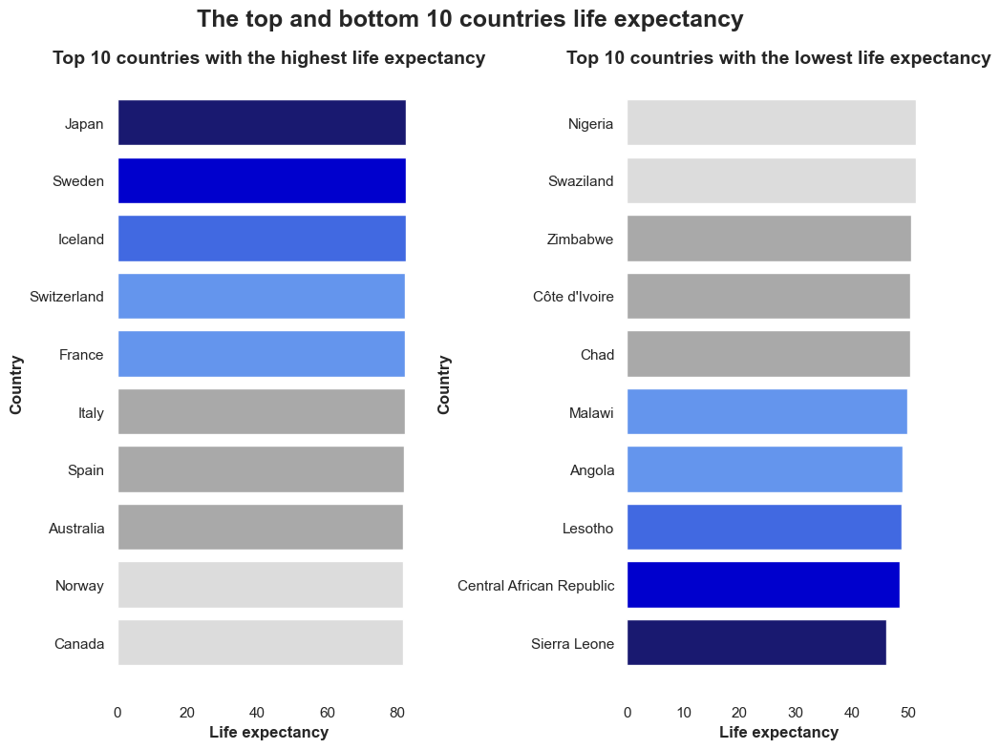

In [26]:
#Plotting bar chart for the top and bottom 10 countries life expectancy

df_who_avg_LifeExp = pd.DataFrame(df_who_nulls_filled\
                                  .groupby(['Country'])['Life expectancy']\
                                  .mean()\
                                  .sort_values(ascending=True))

#Creating top 10 list
df_who_avg_LifeExp_top10 = df_who_avg_LifeExp.iloc[-10:]

#Creating bottom 10 list
df_who_avg_LifeExp_bottom10 = df_who_avg_LifeExp.iloc[:10]

#Plotting bar chart top 10
fig = plt.figure()
 
ax1 = plt.subplot(121)

ax1.barh(y=df_who_avg_LifeExp_top10.index, 
        width='Life expectancy',
        data= df_who_avg_LifeExp_top10,
        color=['gainsboro', 
                'gainsboro', 
                'darkgrey', 
                'darkgrey',
                'darkgrey', 
                'cornflowerblue',
                'cornflowerblue', 
                'royalblue', 
                'mediumblue', 
                'midnightblue'])

ax1.set_xlabel('Life expectancy', 
               fontsize=12, 
               fontweight='bold')

ax1.set_ylabel('Country', 
               fontsize=12, 
               fontweight='bold')

ax1.set_title('Top 10 countries with the highest life expectancy',
              fontsize=14, 
              fontweight='bold')

ax1.set_frame_on(False)

#Plotting bar chart bottom 10
ax2 = plt.subplot(122)

ax2.barh(y=df_who_avg_LifeExp_bottom10.index, 
        width='Life expectancy',
        data=df_who_avg_LifeExp_bottom10,
        color=['midnightblue',
                'mediumblue',
                'royalblue',
                'cornflowerblue',
                'cornflowerblue',
                'darkgrey',
                'darkgrey',
                'darkgrey',
                'gainsboro',
                'gainsboro'])

ax2.set_xlabel('Life expectancy', 
               fontsize=12, 
               fontweight='bold')

ax2.set_ylabel('Country', 
               fontsize=12, 
               fontweight='bold')

ax2.set_title('Top 10 countries with the lowest life expectancy',
              fontsize=14, 
              fontweight='bold')

ax2.set_frame_on(False)

plt.suptitle('The top and bottom 10 countries life expectancy', 
             fontsize=18, 
             fontweight='bold')

plt.tight_layout()

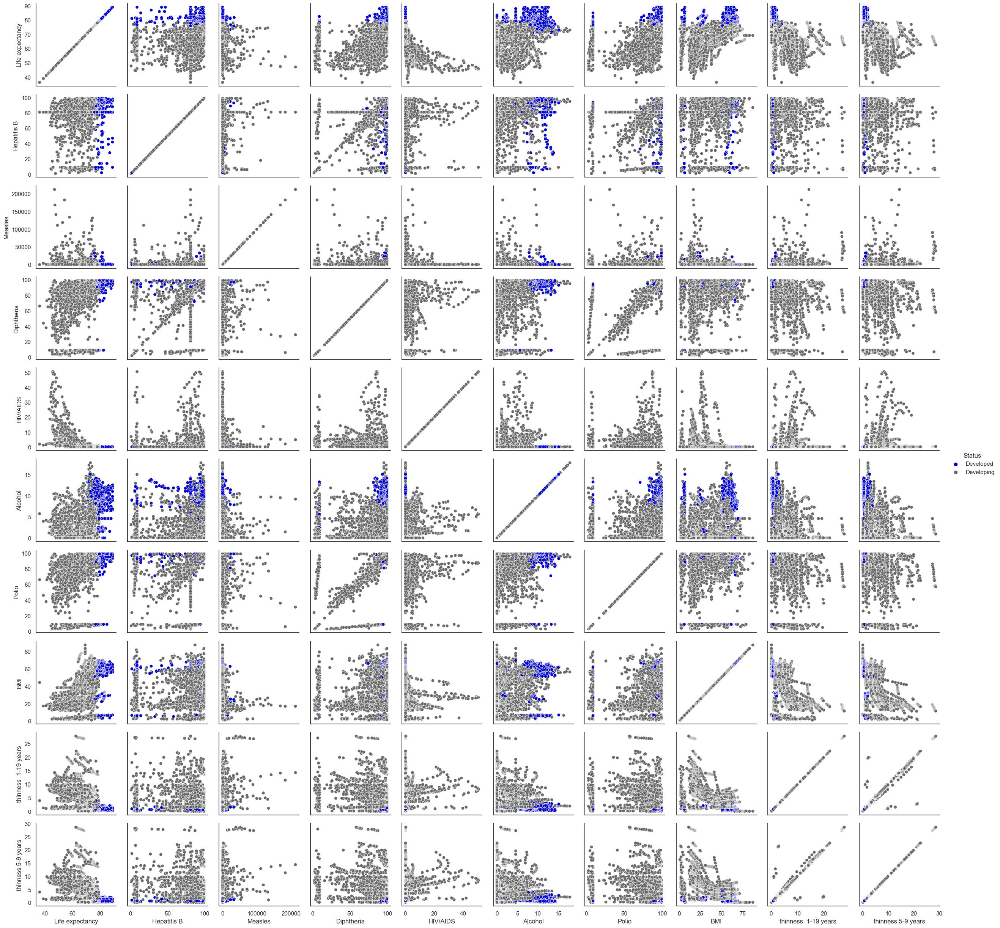

In [27]:
#Scatter plot to determine link of life expectancy mortality and health
df_who_life_AdultMortality_diseases = df_who_nulls_filled.copy()

#Creating new dataframe with life expectancy and health variables
df_who_life_AdultMortality_diseases_2 = df_who_life_AdultMortality_diseases[['Life expectancy',
                                                                             'Status',
                                                                             'Hepatitis B',
                                                                             'Measles',
                                                                             'Diphtheria',
                                                                             'HIV/AIDS',
                                                                             'Alcohol',
                                                                             'Polio',
                                                                             'BMI',
                                                                             'thinness  1-19 years',
                                                                             'thinness 5-9 years']]

g = sns.PairGrid(df_who_life_AdultMortality_diseases_2, 
                 hue='Status', 
                 palette=['mediumblue', 'dimgrey'])

g.map(sns.scatterplot)

g.add_legend()

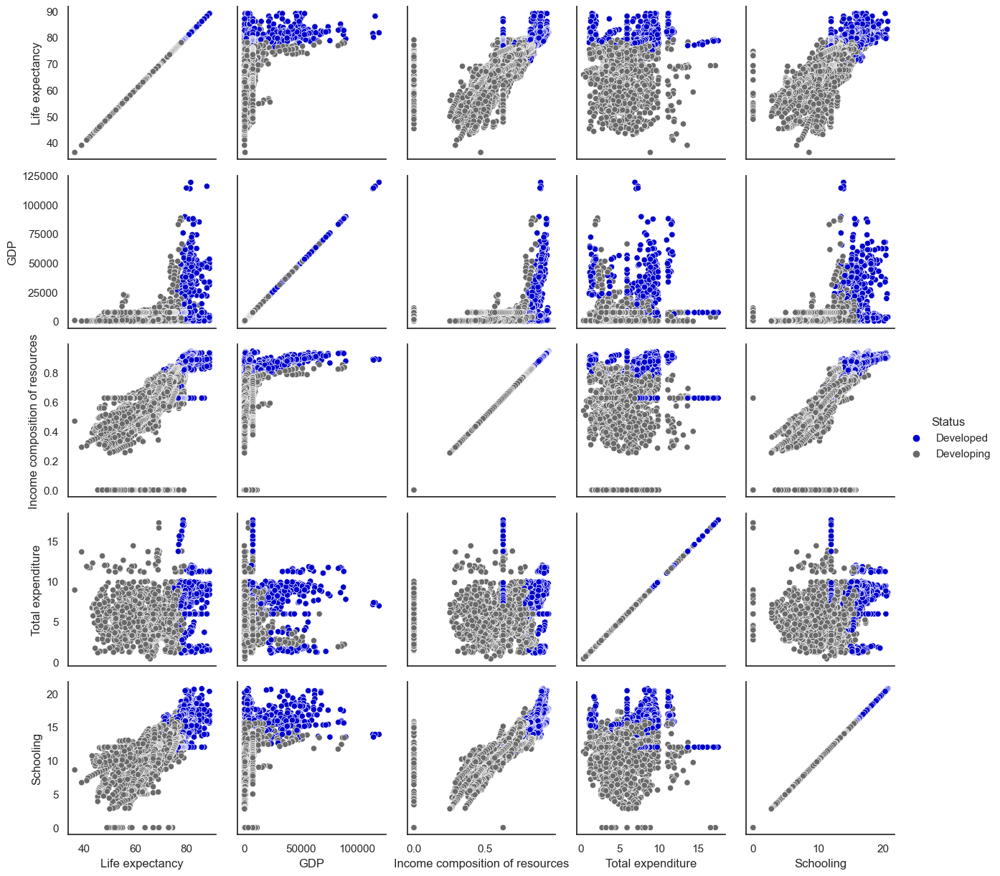

In [28]:
#scatter plot to determine link of life expectancy and socio-economic variables
df_who_SocioEconomic = df_who_nulls_filled.copy()

#Creating new dataframe with life expectancy and socio-economic variables
df_who_SocioEconomic_2 = df_who_SocioEconomic[['Life expectancy',
                                               'Status',
                                               'GDP',
                                               'Income composition of resources', 
                                               'Total expenditure',
                                               'Schooling']]


g = sns.PairGrid(df_who_SocioEconomic_2, 
                 hue='Status', 
                 palette=['mediumblue', 'dimgrey'])


g.map(sns.scatterplot)

g.add_legend()

##### Distribtions of all variables in the data set

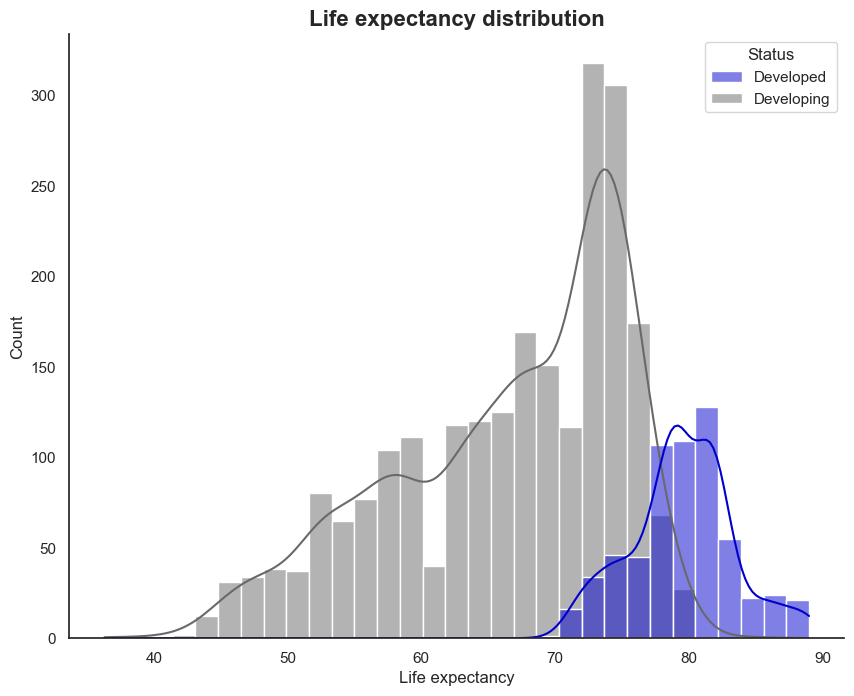

In [29]:
#distribution of life expectancy developed vs developing
def distribution(x,y):
    fig, ax = plt.subplots()
    sns.histplot(data=df_who_nulls_filled,
                 x=x, 
                 hue='Status', 
                 palette=['mediumblue', 'dimgrey'],
                 kde=True)
    
    plt.title(y,
             fontsize=16,
             fontweight='bold')
    
    ax.spines['top'].set_visible(False)

    ax.spines['right'].set_visible(False)


distribution('Life expectancy', 'Life expectancy distribution') #Calling  function

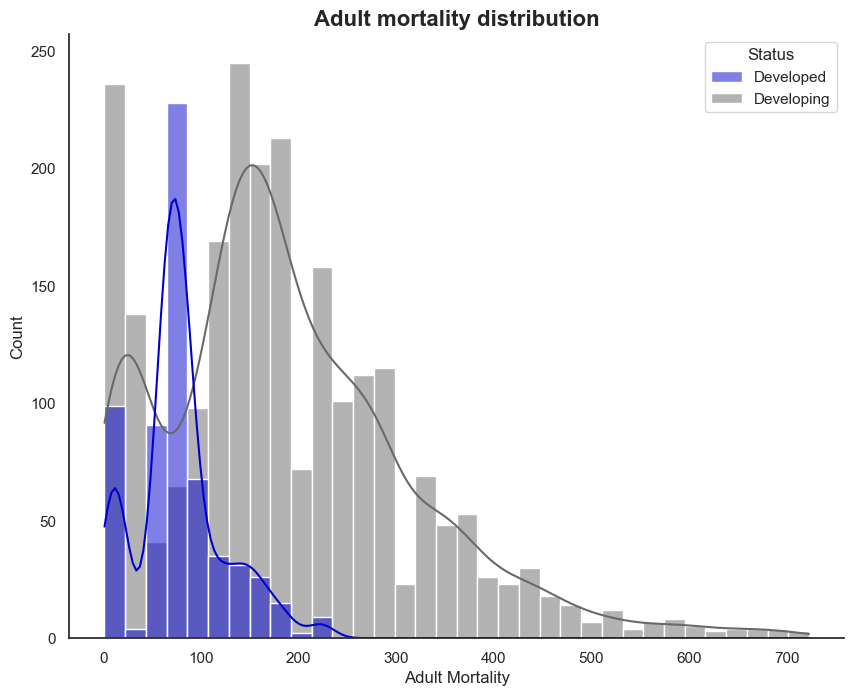

In [30]:
#Distribution of adult mortality of developed vs developing
distribution('Adult Mortality', 'Adult mortality distribution') #Calling function

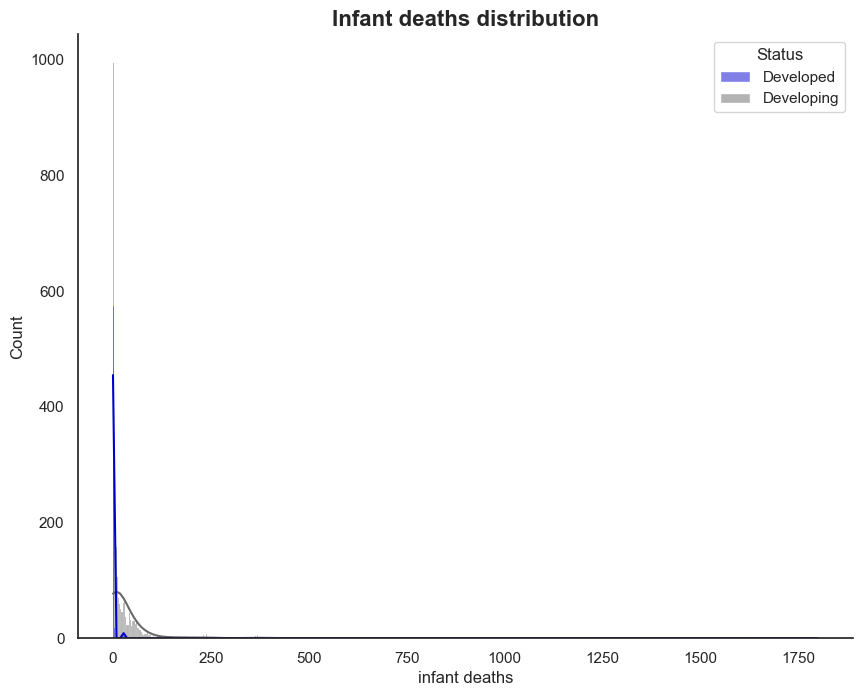

In [31]:
#distribution of infant deaths for developed and vs developing
distribution('infant deaths', 'Infant deaths distribution') #Calling function

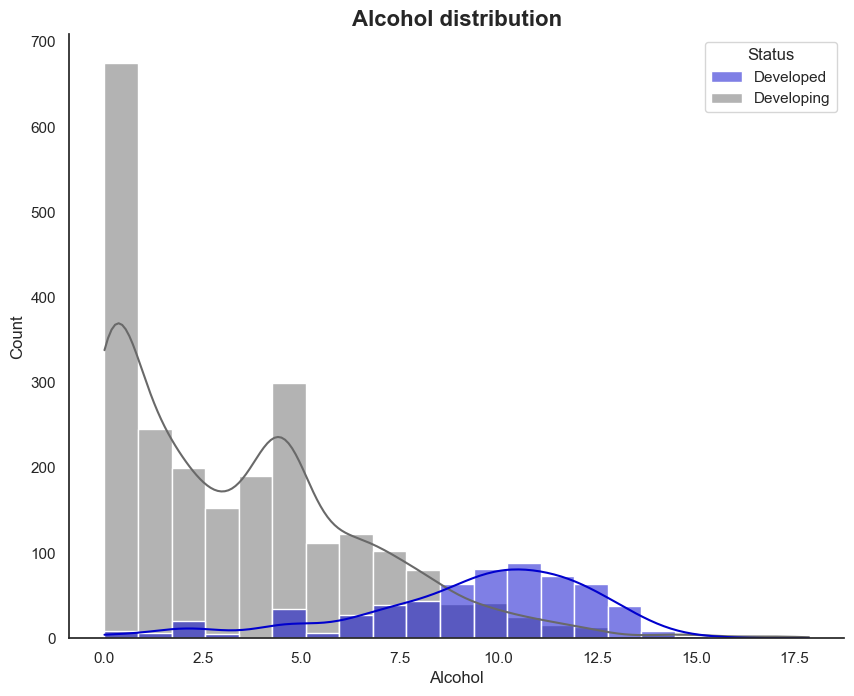

In [32]:
#Distribution of alcohol of developed vs developing
distribution('Alcohol', 'Alcohol distribution') #Calling function

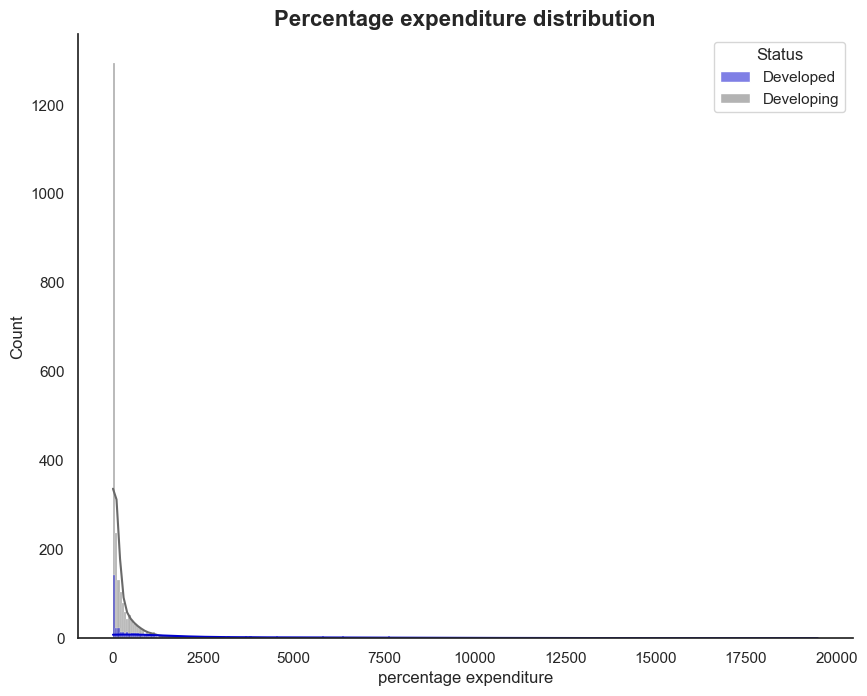

In [33]:
#Distribution of percentage expenditure of developed vs developing
distribution('percentage expenditure', 'Percentage expenditure distribution') #Calling function

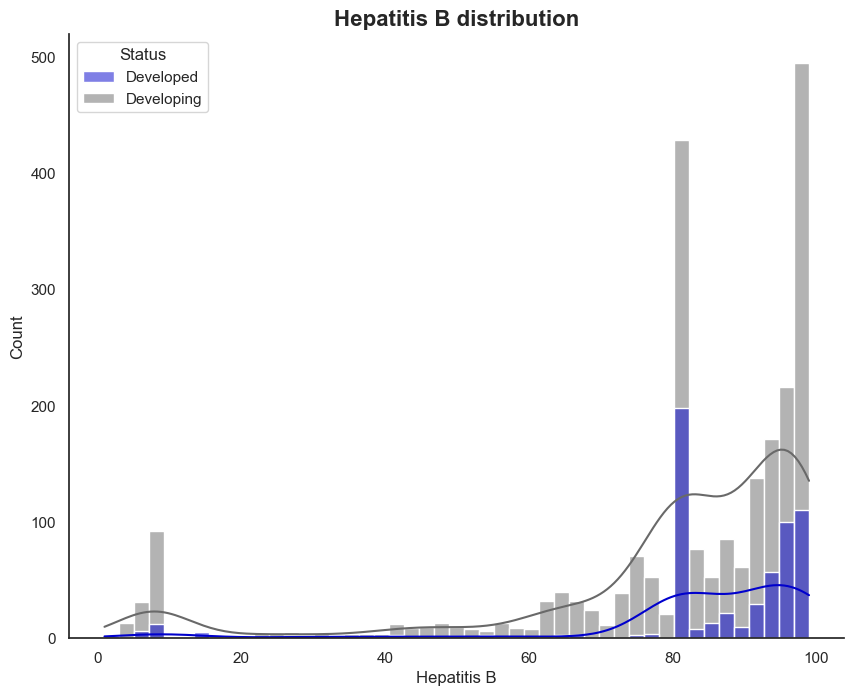

In [34]:
#Distribution of hepatitis b of developed vs developing
distribution('Hepatitis B', 'Hepatitis B distribution') #Calling function

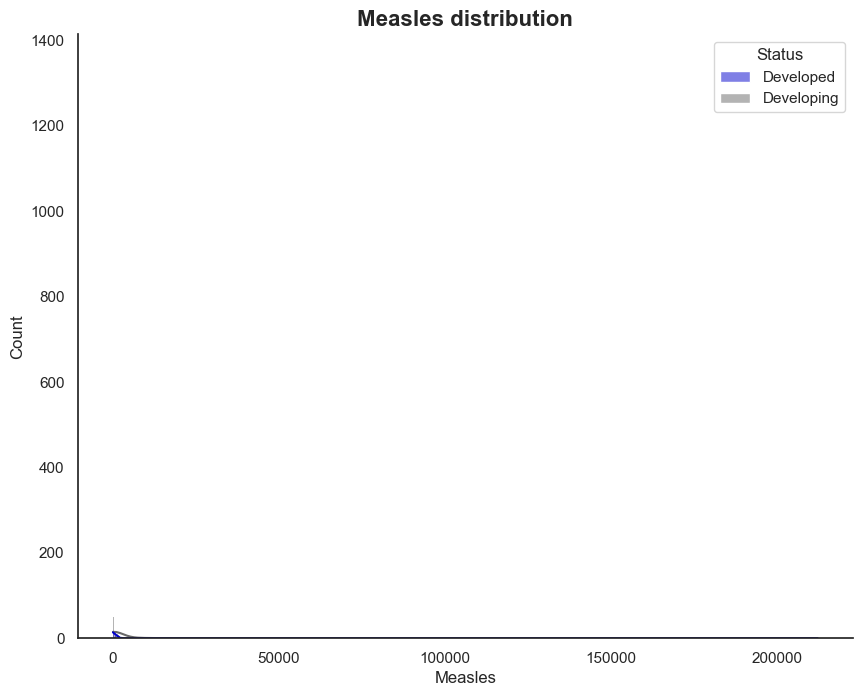

In [35]:
#Distribution of measles of developed vs developing
distribution('Measles', 'Measles distribution') #Calling function

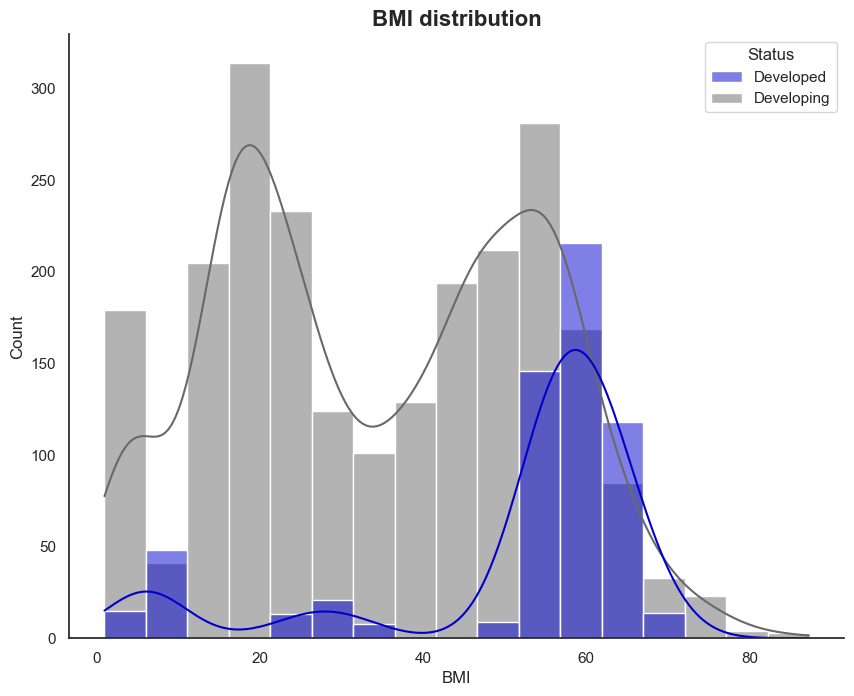

In [36]:
#Distribution of bmi of developed vs developing
distribution('BMI', 'BMI distribution') #Calling function

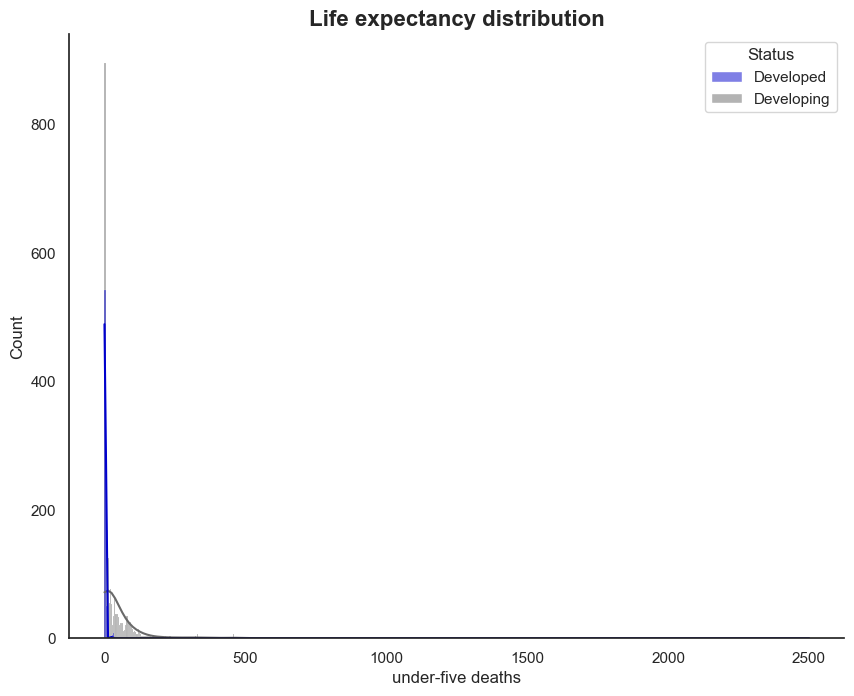

In [37]:
#Distribution of under five deaths of developed vs developing
distribution('under-five deaths', 'Life expectancy distribution') #Calling function

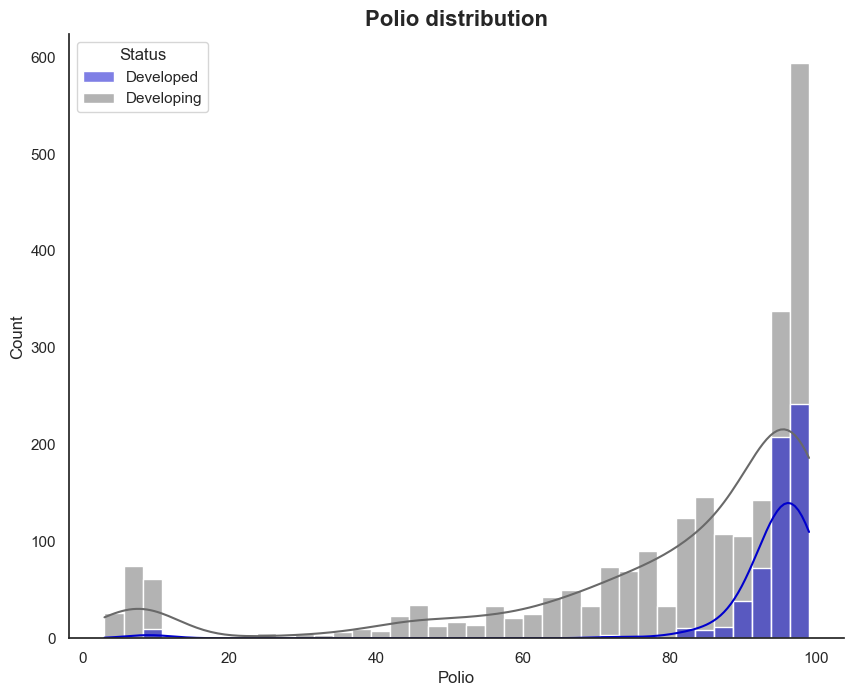

In [38]:
#Distribution of polio of developed vs developing
distribution('Polio', 'Polio distribution') #Calling function

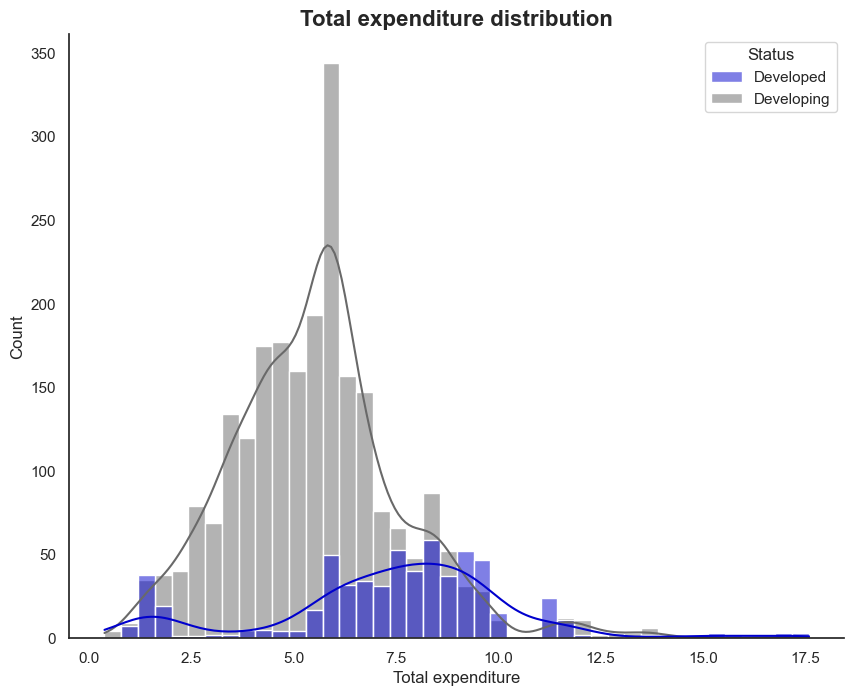

In [39]:
#Distribution of total expenditure of developed vs developing
distribution('Total expenditure', 'Total expenditure distribution') #Calling function

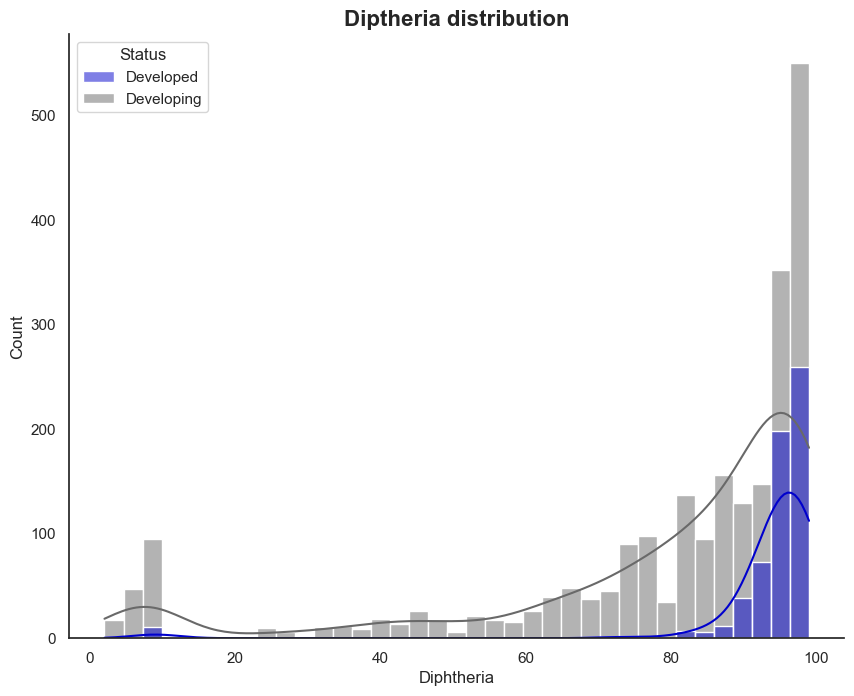

In [40]:
#Distribution of diptheria of developed vs developing
distribution('Diphtheria', 'Diptheria distribution') #Calling function

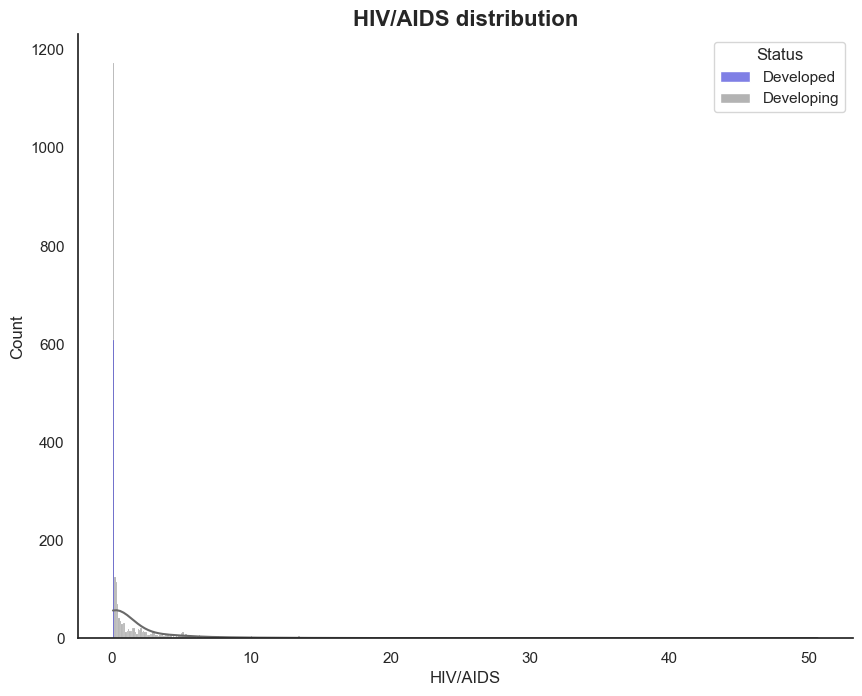

In [41]:
#Distribution of HIV/AIDS of developed vs developing
distribution('HIV/AIDS', 'HIV/AIDS distribution') #Calling function

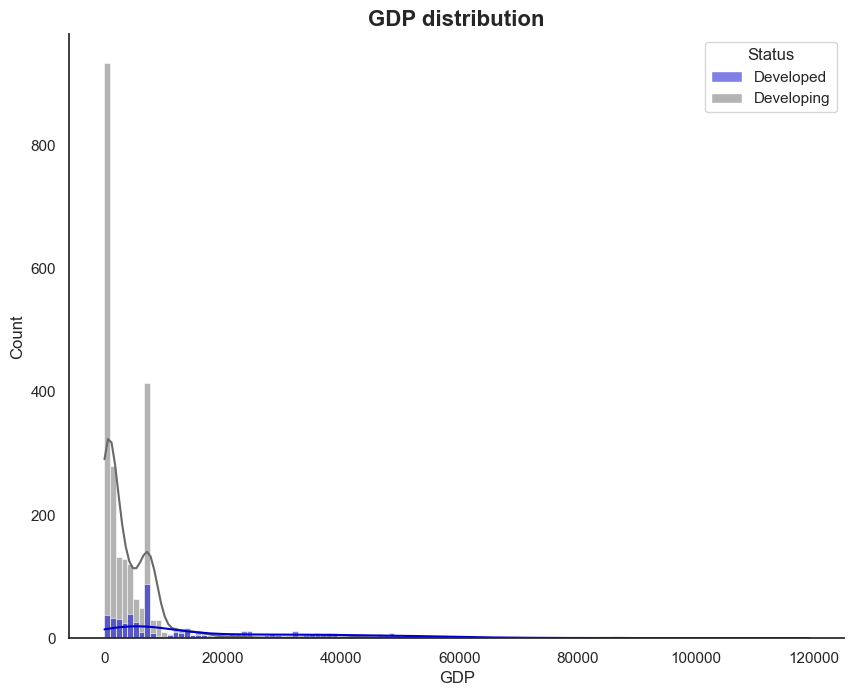

In [42]:
#Distribution of GDP of developed vs developing
distribution('GDP', 'GDP distribution') #Calling function

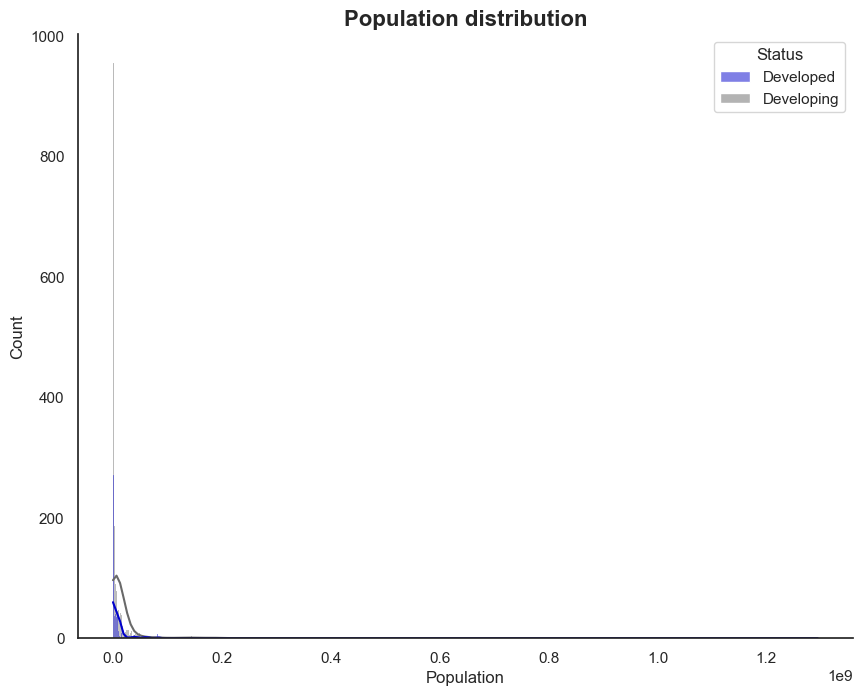

In [43]:
#Distribution of total expendiyure of developed vs developing
distribution('Population', 'Population distribution') #Calling function

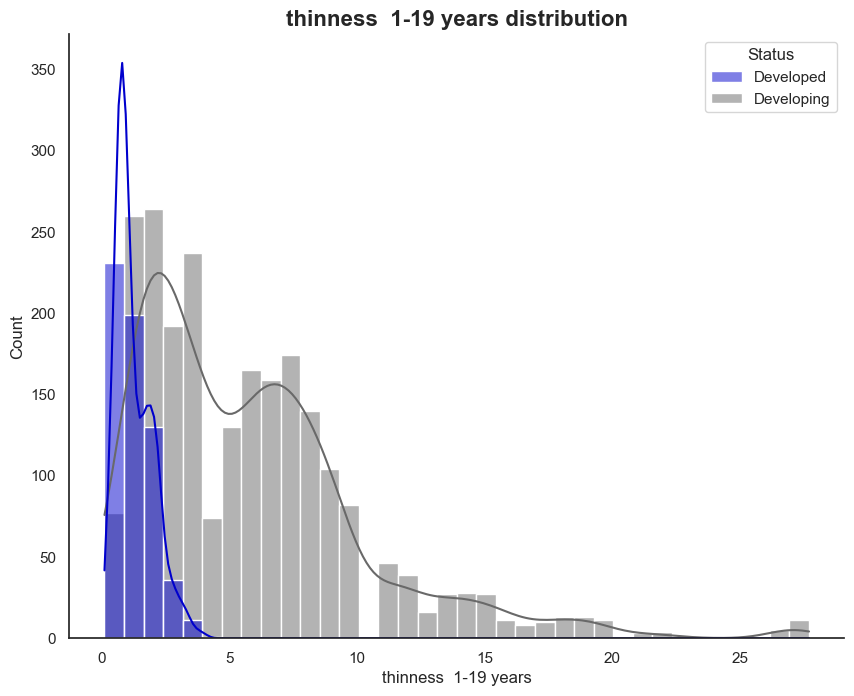

In [44]:
#Distribution of thinness 1-19 years of developed vs developing
distribution('thinness  1-19 years', 'thinness  1-19 years distribution') #Calling function

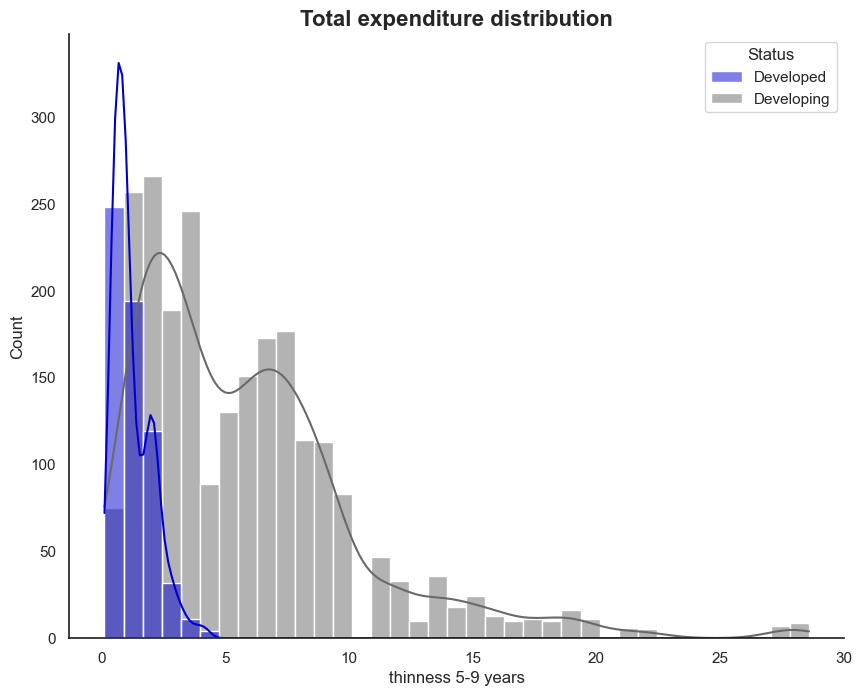

In [45]:
#Distribution of thinness 5-9 years of developed vs developing
distribution('thinness 5-9 years', 'Total expenditure distribution') #Calling function

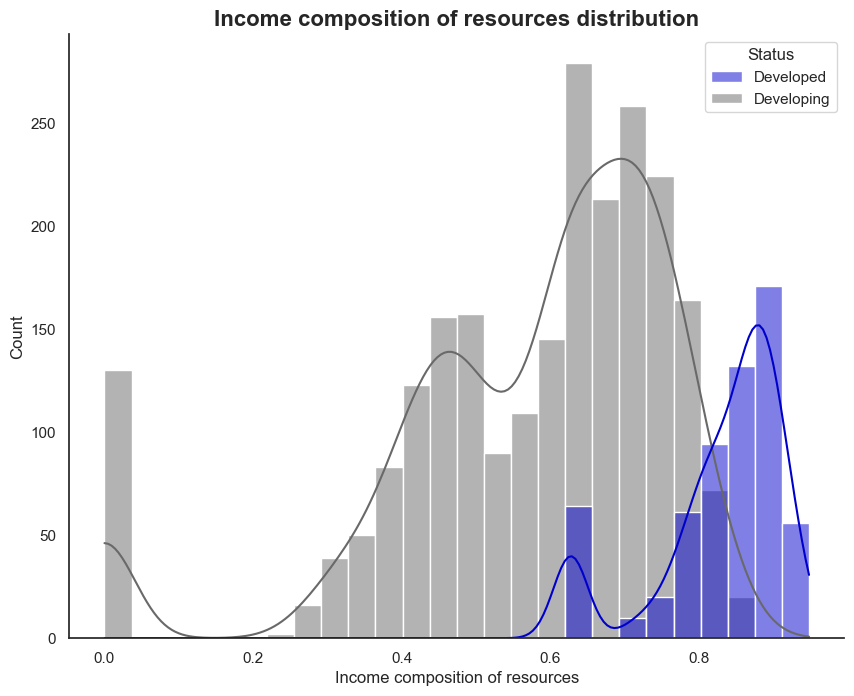

In [46]:
#Distribution of income composition resources of developed vs developing
distribution('Income composition of resources', 'Income composition of resources distribution') #Calling function

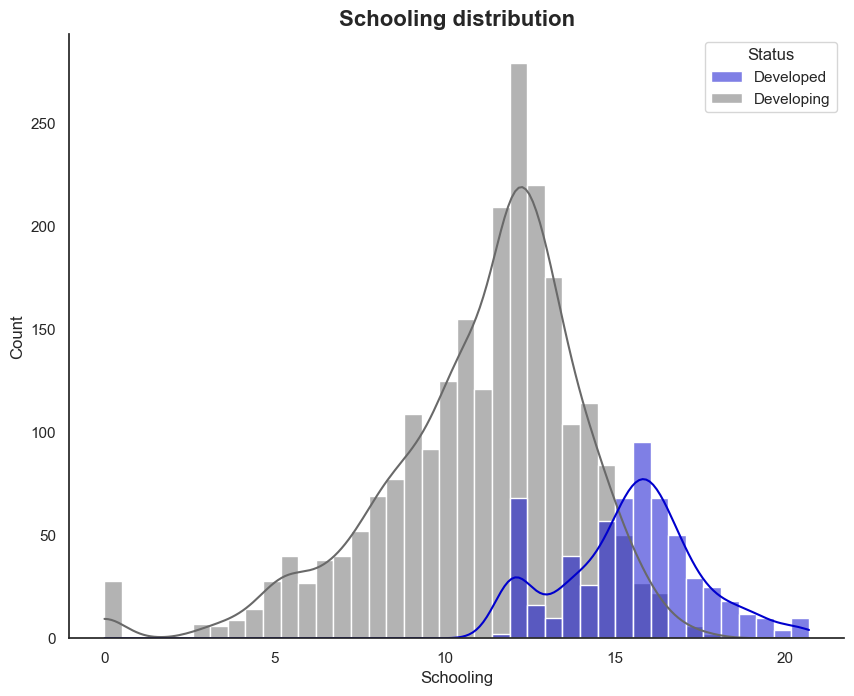

In [47]:
#Distribution of thinness 5-9 years of developed vs developing
distribution('Schooling', 'Schooling distribution') #Calling function

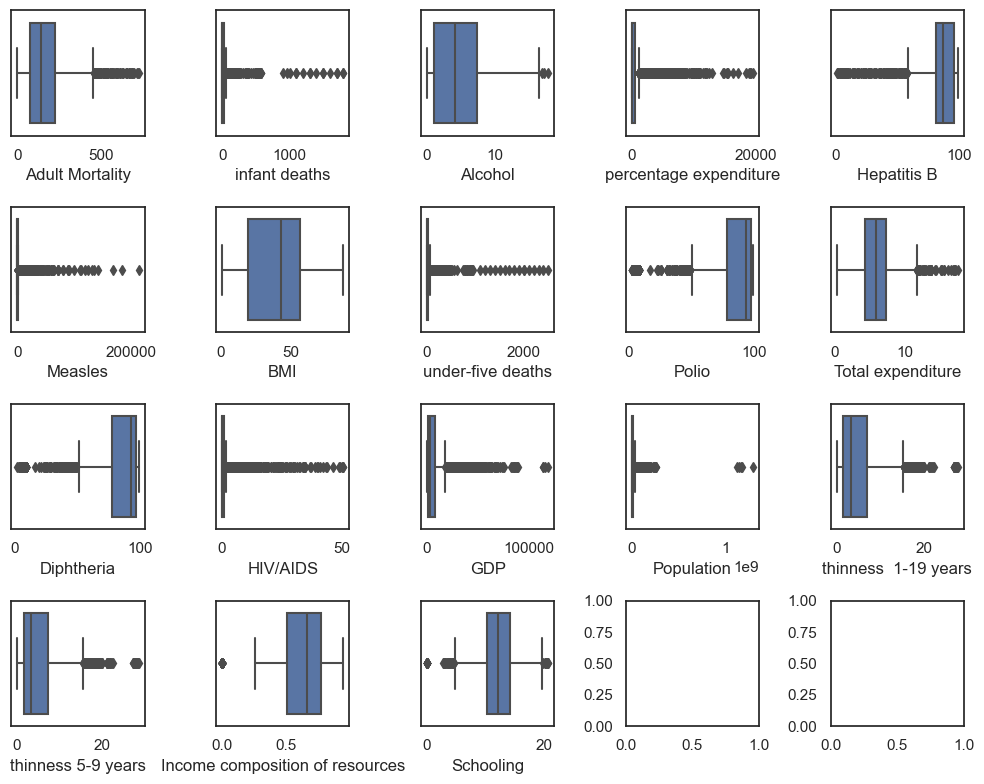

In [48]:
#Plotting boxplots to visualise outliers
fig, axes = plt.subplots(4, 5)

sns.boxplot(ax=axes[0, 0], data=df_who_nulls_filled, x='Adult Mortality')
sns.boxplot(ax=axes[0, 1], data=df_who_nulls_filled, x='infant deaths')
sns.boxplot(ax=axes[0, 2], data=df_who_nulls_filled, x='Alcohol')
sns.boxplot(ax=axes[0, 3], data=df_who_nulls_filled, x='percentage expenditure')
sns.boxplot(ax=axes[0, 4], data=df_who_nulls_filled, x='Hepatitis B')
sns.boxplot(ax=axes[1, 0], data=df_who_nulls_filled, x='Measles')
sns.boxplot(ax=axes[1, 1], data=df_who_nulls_filled, x='BMI')
sns.boxplot(ax=axes[1, 2], data=df_who_nulls_filled, x='under-five deaths')
sns.boxplot(ax=axes[1, 3], data=df_who_nulls_filled, x='Polio')
sns.boxplot(ax=axes[1, 4], data=df_who_nulls_filled, x='Total expenditure')
sns.boxplot(ax=axes[2, 0], data=df_who_nulls_filled, x='Diphtheria')
sns.boxplot(ax=axes[2, 1], data=df_who_nulls_filled, x='HIV/AIDS')
sns.boxplot(ax=axes[2, 2], data=df_who_nulls_filled, x='GDP')
sns.boxplot(ax=axes[2, 3], data=df_who_nulls_filled, x='Population')
sns.boxplot(ax=axes[2, 4], data=df_who_nulls_filled, x='thinness  1-19 years')
sns.boxplot(ax=axes[3, 0], data=df_who_nulls_filled, x='thinness 5-9 years')
sns.boxplot(ax=axes[3, 1], data=df_who_nulls_filled, x='Income composition of resources')
sns.boxplot(ax=axes[3, 2], data=df_who_nulls_filled, x='Schooling')

plt.tight_layout()

The outliers in this project will not be removed beause they represent the natural occurance of the data.

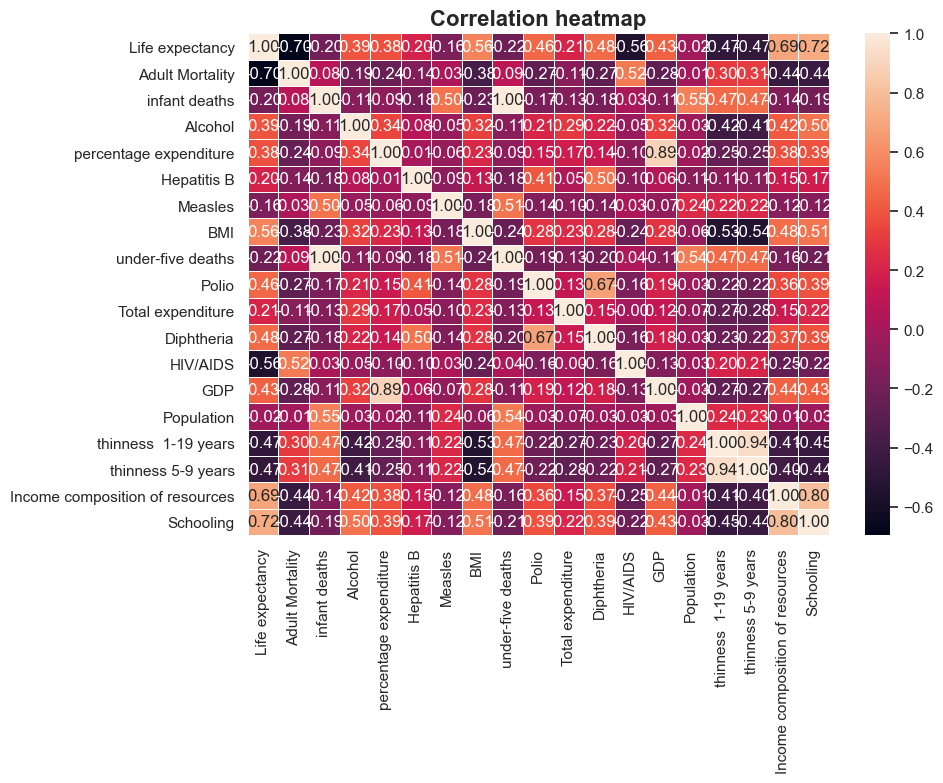

In [49]:
#Correlation heatmap
sns.heatmap(df_who_nulls_filled.drop(columns='Year').corr(),
            annot=True, 
            fmt=".2f", 
            linewidth=.5)

plt.title('Correlation heatmap',
         fontsize=16, 
         fontweight='bold')

plt.tight_layout()

plt.show()


The variables which have reasonable strong correlations (I am basing this on correlations that are above 0.5) which will be chosen for the regression analysis are adult mortality, BMI, HIV/AIDS, income composition of resources and schooling

## Summaring the  variables to be used for regression using a raincloud chart

A raincloud chart shows three visualisations, it combines a cloud of points with a box plot and a one-sided violin plot.

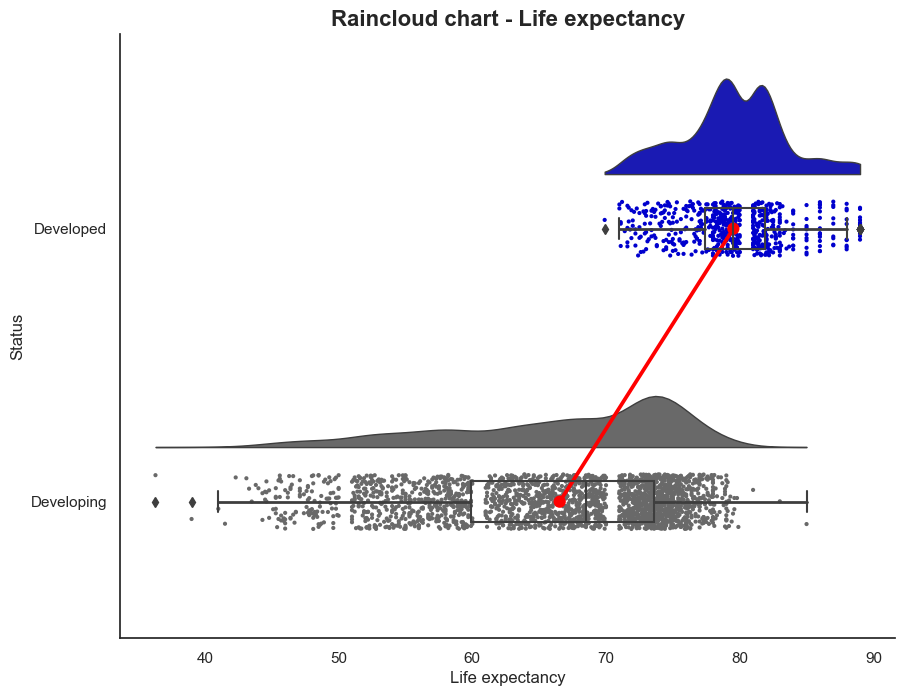

In [50]:
#Plotting adult mortality
#Creating function
def raincloud(x,y):
    fig, ax = plt.subplots()

    ax = pt.RainCloud(x='Status',
                      y=x, 
                      data=df_who_nulls_filled,
                      orient='h',
                      pointplot=True,
                      palette=['mediumblue', 'dimgrey'])

    plt.title(y, 
         fontsize=16,
         fontweight='bold')

    ax.spines['top'].set_visible(False)

    ax.spines['right'].set_visible(False)

    plt.show()

#Calling function
raincloud('Life expectancy', 'Raincloud chart - Life expectancy')

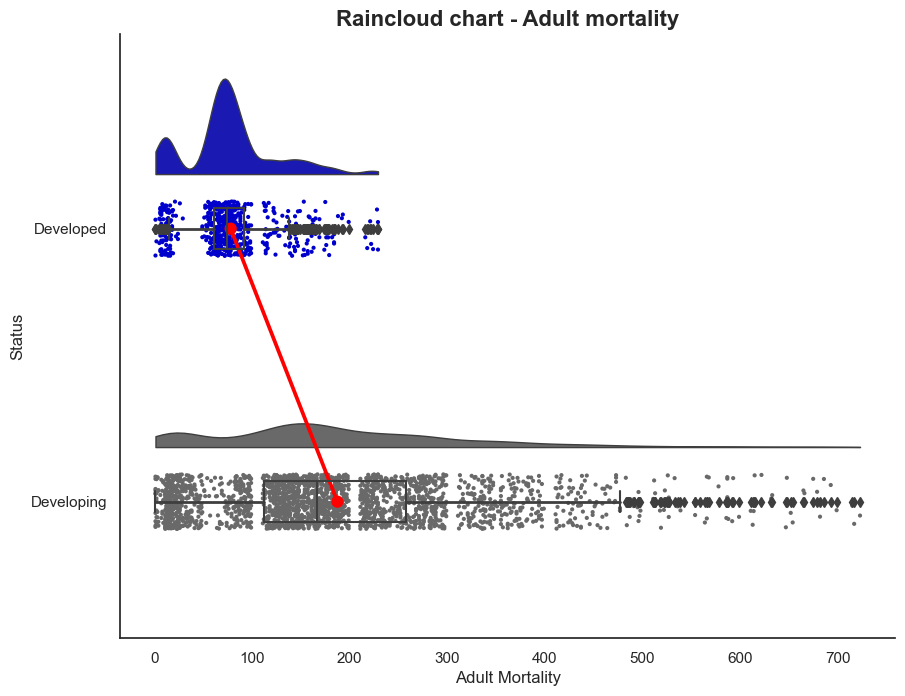

In [51]:
#Calling function
raincloud('Adult Mortality', 'Raincloud chart - Adult mortality')

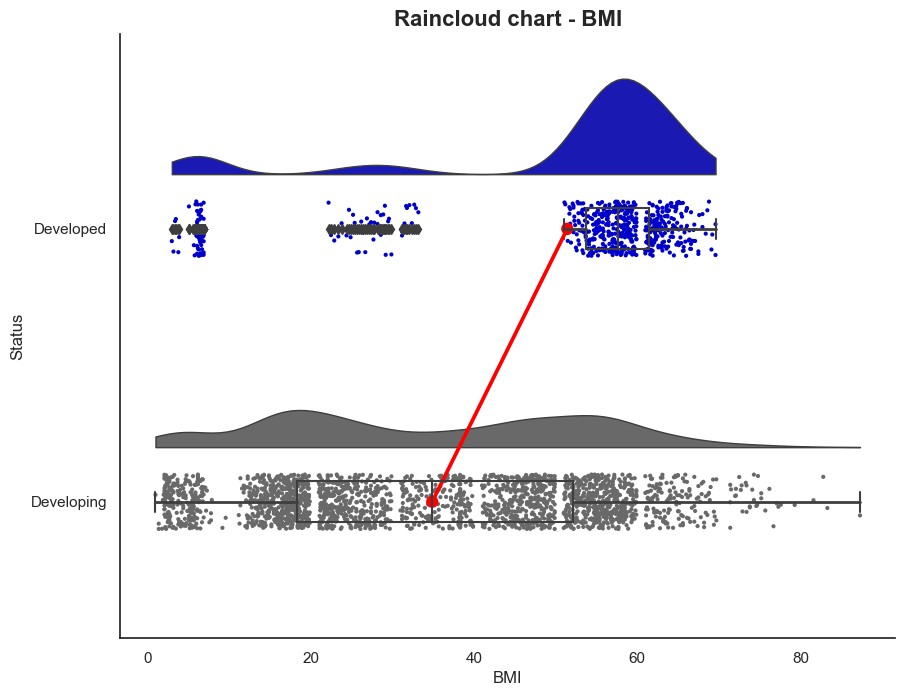

In [52]:
#Calling function
raincloud('BMI', 'Raincloud chart - BMI')

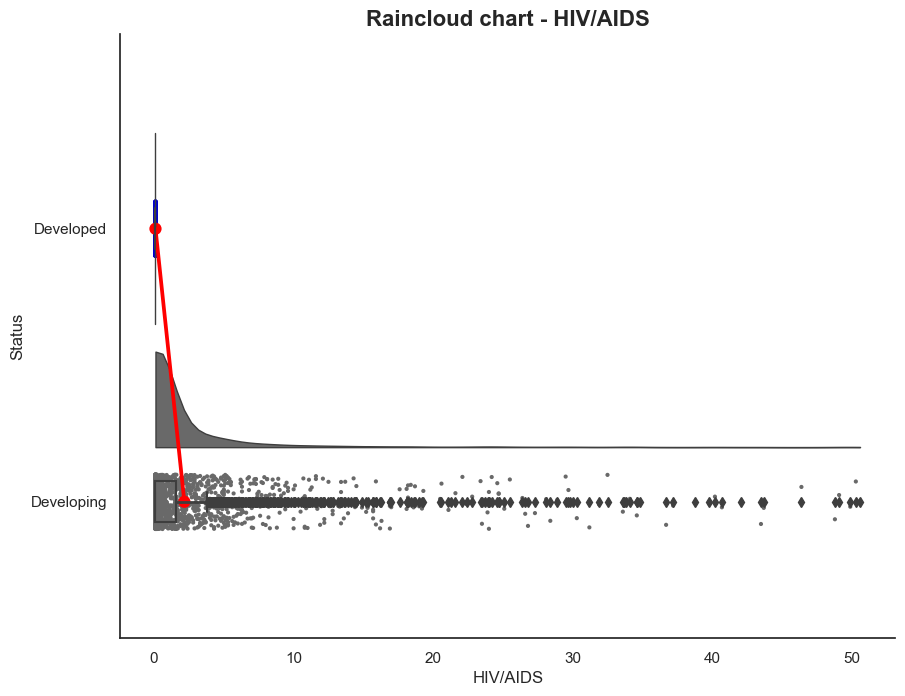

In [53]:
#Calling function
raincloud('HIV/AIDS', 'Raincloud chart - HIV/AIDS')

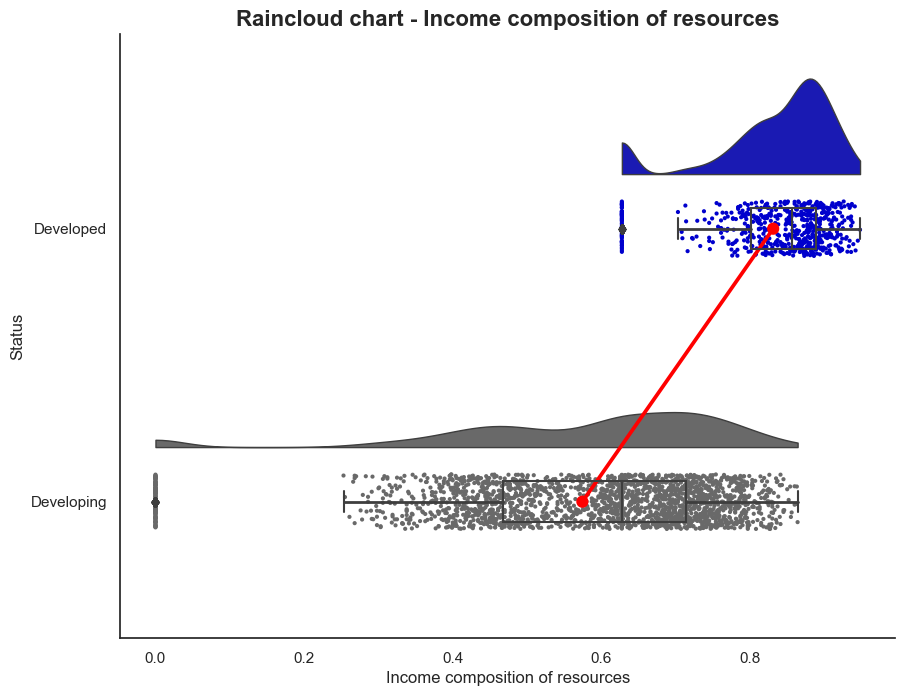

In [54]:
#Calling function
raincloud('Income composition of resources', 'Raincloud chart - Income composition of resources')

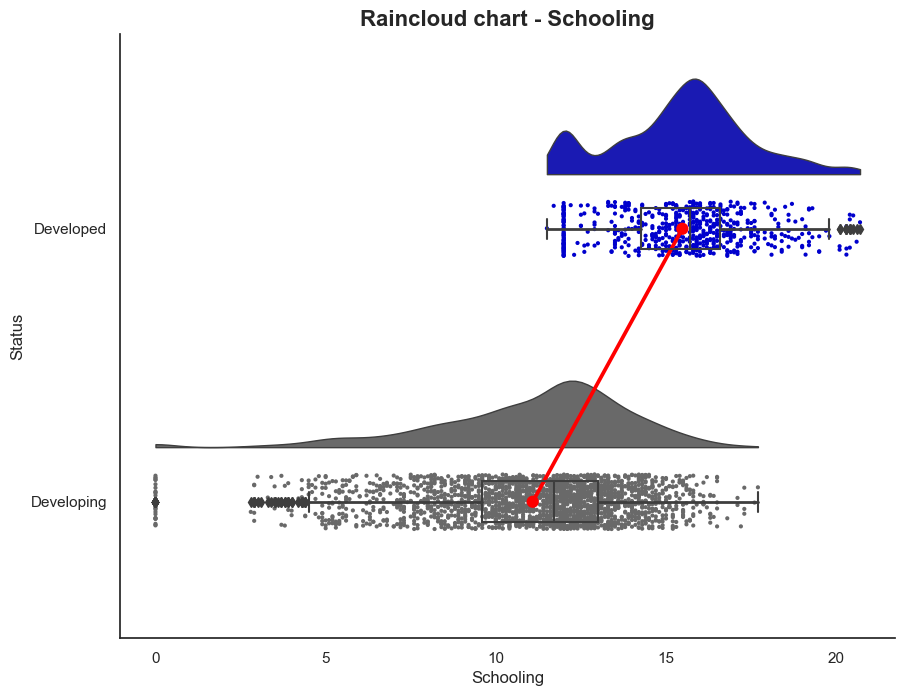

In [55]:
#Calling function
raincloud('Schooling', 'Raincloud chart - Schooling')

# Regression model

## Train-Test

In [56]:
#Creating arrays for the explanatory and predictor variables
x = df_who_nulls_filled[['Income composition of resources', 
                         'Schooling', 
                         'HIV/AIDS', 
                         'BMI', 
                         'Adult Mortality']].values

y = df_who_nulls_filled['Life expectancy'].values

In [57]:
#Spliting the data into training set and test set
X_train, X_test, y_train, y_test = train_test_split (x, y, test_size=0.25, random_state=42)

In [58]:
#reshaping the arrays for the purpose of applying the Standard Scalar
y_train = y_train.reshape(len(y_train), 1)
y_test = y_test.reshape(len(y_test), 1)

In [59]:
#standardising the array values
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.fit_transform(X_test)
y_train_sc = sc.fit_transform(y_train)
y_test_sc = sc.fit_transform(y_test)

## Fitting, training and testing the model

In [60]:
model_ran_forest = RandomForestRegressor()

In [61]:
#Training the model
model_ran_forest.fit(X_train, y_train)

RandomForestRegressor()

In [62]:
#Predicting the predictor variable
y_pred = model_ran_forest.predict(X_test)

## Metrics

In [63]:
#accuracy of the model
model_ran_forest.score(X_test, y_test)

0.9601296069149508

In [64]:
#calculating mean absolute error
mean_absolute_error(y_test, y_pred)

1.2753510204081604

In [65]:
#calculating mean squared errors
mean_squared_error(y_test, y_pred)

3.589619005715082